In [2]:
# Python ≥ 3.7 is required
import sys
assert sys.version_info >= (3, 7)

# Scikit-Learn ≥ 1.0.1 is required
import sklearn
#assert sklearn.__version__ >= '1.0.2'

# TensorFlow ≥ 2.0 is required
import tensorflow as tf
print('Tensorflow version:', tf.__version__)

# Keras ≥ 2.4 is required
from tensorflow import keras
print('Keras version:', keras.__version__) 

# Common imports
import numpy as np
import os

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize = 14)
mpl.rc('xtick', labelsize = 12)
mpl.rc('ytick', labelsize = 12)
import seaborn as sbs
print('MPL version:', mpl.__version__) 

# Sci-kit Learn
from sklearn.datasets import load_iris, load_wine
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import cross_val_score
import pandas as pd

# RDKit
import rdkit as rdk
from rdkit import Chem
from rdkit.Chem import RDKFingerprint
from rdkit.Chem import rdMolDescriptors
from rdkit.Chem import PandasTools
from rdkit.Chem import Descriptors
import pandas as pd


Tensorflow version: 2.10.0
Keras version: 2.10.0
MPL version: 3.6.2


In [3]:
# Import main data and get list of SMILES
freesolv = pd.read_csv('datasets/final_project_data_22/freesolv_rdkit_descriptors.csv', index_col = 0)  # Load the freesolv dataset using pandas.
                                                                                                        # Replace path with your own.
smiles_list = freesolv['smiles'].to_list()

In [4]:
#freesolv.iloc[:,124:].loc[:, (freesolv != 0).any(axis=0)] #only the functional groups

In [5]:
# Initialise a new pandas df with rdkit descriptors
rdkit_descriptors = pd.DataFrame(data = {"smiles": np.array((smiles_list)) })
rdk.Chem.PandasTools.AddMoleculeColumnToFrame(rdkit_descriptors, smilesCol='smiles') #add ROMol column using smiles for purpose of rdk SMARTS search

### Discerning FGs in each Molecule
Report whether a molecule has a certain functional group or not using SMARTS syntax. Not necessarily needed anymore, as RDKit has its own FG data in the freesolv_rdkit_descriptors.csv.

In [6]:
#Functional Group Queries using Dictionaries
#Use SMARTS strings from https://github.com/openbabel/openbabel/blob/master/data/SMARTS_InteLigand.txt
#can use https://github.com/Sulstice/global-chem instead? 
functionalGroups = {
    'Alcohol' : '[OX2H][CX4;!$(C([OX2H])[O,S,#7,#15])]', #only alcohols
    'Amine' : '[NX3+0,NX4+;!$([N]~[!#6]);!$([N]*~[#7,#8,#15,#16])]', #hits all amines (prim/sec/tert/quart), including ammonium salts, also enamines, but not amides, imides, aminals...
    'Amide' : '[CX3;$([R0][#6]),$([H1R0])](=[OX1])[#7X3;$([H2]),$([H1][#6;!$(C=[O,N,S])]),$([#7]([#6;!$(C=[O,N,S])])[#6;!$(C=[O,N,S])])]', #doesn't hit lactams
    'Ketone' : '[#6][CX3](=[OX1])[#6]', #does not include oxo-groups connected to a (hetero-) aromatic ring
    'Aldehyde' : '[$([CX3H][#6]),$([CX3H2])]=[OX1]', #hits aldehydes including formaldehyde
    'AcetalLike' : '[NX3v3,SX2,OX2;!$(*C=[#7,#8,#15,#16])][CX4;!$(C([N,S,O])([N,S,O])[!#6])][FX1,ClX1,BrX1,IX1,NX3v3,SX2,OX2;!$(*C=[#7,#8,#15,#16])]',
    'Carboxylic Acid' : '[CX3;$([R0][#6]),$([H1R0])](=[OX1])[$([OX2H]),$([OX1-])]', # includes carboxylate anions
    'Ester' : '[CX3;$([R0][#6]),$([H1R0])](=[OX1])[OX2][#6;!$(C=[O,N,S])]', # does not hit anhydrides or lactones
    'Lactone' :'[#6][#6X3R](=[OX1])[#8X2][#6;!$(C=[O,N,S])]' # may also be aromatic
}

In [7]:
# https://github.com/Sulstice/global-chem/blob/development/global_chem/global_chem/medicinal_chemistry/scaffolds/iupac_blue_book.py
# C:7 IUPAC common functional groups
commonFxGroups = {
            'acetamido':'[#8]=[#6](-[#7])-[#6]',
            'acetoacetyl':'[#8]=[#6](-[#6])-[#6]-[#6](=[#8])-[#8]',
            'acetyl':'[#6](-[#6])=[#8]',
            'acryloyl':'[#6]=[#6]-[#6](-[#6])=[#8]',
            'alanyl':'[#7]-[#6H](-[#6])-[#6](-[#6])=[#8]',
            'beta-alanyl':'[#7]-[#6]-[#6]-[#6](-[#6])=[#8]',
            'allyl':'[#6H2]-[#6]=[#6]',
            'allylidene':'[#6H]-[#6]=[#6]',
            'amidino':'[#7]-[#6]=[#7]',
            'amino':'[#7]',
            'amyl':'[#6H2]-[#6]-[#6]-[#6]-[#6]',
            'anilino':'[#7]-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1',
            'anisidino':'[#7]-[#6]1:[#6]:[#6]:[#6](-[#8]-[#6]):[#6]:[#6]:1',
            'anthranoyl':'[#7]-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1-[#6](-[#6])=[#8]',
            'arsino':'[AsH3]',
            'azelaoyl':'[#8]=[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]=[#8]',
            'azido':'[#7]=[#7+]=[#7-]',
            'azo':'[#6]/[#7]=[#7]/[#6]',
            'azoxy':'[#6]/[#7]=[#7+](\[#8-])-[#6]',
            'benzal':'[#6H]-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1',
            'benzamido':'[#8]=[#6](-[#7])-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1',
            'benzhydrol':'[#8]-[#6](-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1)-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1',
            'benzoxy':'[#8]-[#6]-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1',
            'benzoyl':'[#8]=[#6]-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1',
            'benzyl':'[#6H2]-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1',
            'benzylidene':'[#6H]-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1',
            'benzylidyne':'[#6]-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1',
            'biphenylyl':'[#6]1(-[#6]2:[#6]:[#6]:[#6]:[#6]:[#6]:2):[#6]:[#6]:[#6]:[#6]:[#6]:1',
            'biphenylene':'[#6]12=[#6]3:[#6]:[#6]:[#6]:[#6]:[#6]:3=[#6]:1:[#6]:[#6]:[#6]:[#6]:2',
            'butoxy':'[#8]-[#6]-[#6]-[#6]-[#6]',
            'sec-butoxy':'[#8]-[#6](-[#6])-[#6]-[#6]',
            'tert-butoxy':'[#8]-[#6](-[#6])(-[#6])-[#6]',
            'butyl':'[#6H2]-[#6]-[#6]-[#6]',
            'sec-butyl':'[#6]-[#6]-[#6H]-[#6]',
            'tert-butyl':'[#6]-[#6](-[#6])-[#6]',
            'butyryl':'[#8]=[#6]-[#6]-[#6]-[#6]',
            'caproyl':'[#6]-[#6]-[#6]-[#6]-[#6]-[#6]=[#8]',
            'capryl':'[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]',
            'capryloyl':'[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]=[#8]',
            'carbamido':'[#6](=[#8])(-[#7])-[#7]',
            'carbamoyl':'[#7]-[#6]=[#8]',
            'carbamyl':'[#7]-[#6]=[#8]',
            'carbazoyl':'[#7]-[#7]-[#6]=[#8]',
            'carbethoxy':'[#8]=[#6]-[#8]-[#6]-[#6]',
            'carbonyl':'[#6H]=[#8]',
            'carboxy':'[#8]=[#6]-[#8]',
            'cetyl':'[#6H2]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]',
            'chloroformyl':'[#8]=[#6]-[#17]',
            'cinnamoyl':'[#8]=[#6]-[#6]=[#6]-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1',
            'cinnamyl':'[#6H2]-[#6]=[#6]-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1',
            'cinnamylidene':'[#6H]-[#6]=[#6]-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1',
            'cresyl':'[#8]-[#6]1:[#6]:[#6]:[#6](-[#6]):[#6]:[#6]:1',
            'crotonoyl':'[#6]/[#6]=[#6]/[#6]=[#8]',
            'crotyl':'[#6H2]/[#6]=[#6]/[#6]',
            'cyanamido':'[#7H]-[#6]#[#7]',
            'cyanato':'[#8]-[#6]#[#7]',
            'cyano':'[#6]#[#7]',
            'decanedioyl':'[#8]=[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]=[#8]',
            'decanoyl':'[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]=[#8]',
            'diazo':'[#7+]=[#7-]',
            'diazoamino':'[#7]=[#7]-[#7]',
            'disilanyl':'[SiH2]-[SiH3]',
            'disiloxanyloxy':'[#8]-[SiH2]-[#8]-[SiH3]',
            'disulfinyl':'[#8]=[#16]-[#16]=[#8]',
            'dithio':'[#16]-[#16]',
            'enanthoyl':'[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]=[#8]',
            'epoxy':'[#8]',
            'ethenyl':'[#6H]=[#6]',
            'ethynyl':'[#6]#[#6]',
            'ethoxy':'[#8]-[#6]-[#6]',
            'ethyl':'[#6H2]-[#6]',
            'ethylene':'[#6]=[#6]',
            'ethylidene':'[#6H]-[#6]',
            'ethylthio':'[#16]-[#6]-[#6]',
            'formamido':'[#8]=[#6]-[#7H]',
            'formyl':'[#6H]=[#8]',
            'furmaroyl':'[#8]=[#6]-[#8]',
            'furfuryl':'[#6H2]-[#6]1:[#6]:[#6]:[#6]:[#8]:1',
            'furfurylidene':'[#6H]-[#6]1:[#6]:[#6]:[#6]:[#8]:1',
            'glutamoyl':'[#7]-[#6@@H](-[#6]-[#6]-[#6]=[#8])-[#6]=[#8]',
            'glutaryl':'[#8]=[#6]-[#6]-[#6]-[#6]-[#6]=[#8]',
            'glycylamino':'[#7H]-[#6](-[#6]-[#7])=[#8]',
            'glycoloyl':'[#8]-[#6]-[#6]=[#8]',
            'glycyl':'[#7]-[#6]-[#6]=[#8]',
            'glyoxyoyl':'[#8]=[#6]-[#6]=[#8]',
            'guanidino':'[#7H]-[#6](-[#7])=[#7]',
            'guanyl':'[#7]=[#6]-[#7]',
            'heptadecanoyl':'[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]=[#8]',
            'heptanamido':'[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6](-[#7H])=[#8]',
            'heptanoyl':'[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]=[#8].[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6](-[#7H])=[#8]',
            'hexadecanoyl':'[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]=[#8].[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]=[#8].[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6](-[#7H])=[#8]',
            'hexamethylene':'[#6]-[#6]-[#6]-[#6]-[#6]-[#6]',
            'hexanedioyl':'[#8]=[#6]-[#6]-[#6]-[#6]-[#6]-[#6]=[#8]',
            'hippuryl':'[#6H2]-[#6]-[#7]-[#6](-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1)=[#8]',
            'hydrazino':'[#7]-[#7H]',
            'hydrazo':'[#7]-[#7]',
            'hydrocinnamoyl':'[#8]=[#6]-[#6]-[#6]-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1',
            'hydroperoxy':'[#8]-[#8]',
            'hydroxyamino':'[#7H]-[#8]',
            'imino':'[#7H]',
            'iodoso':'[#53]=[#8]',
            'iodyl':'[#8]=[#53]=[#8]',
            'isoamyl':'[#6H2]-[#6]-[#6](-[#6])-[#6]',
            'isobutenyl':'[#6H]=[#6](-[#6])-[#6]',
            'isobutoxy':'[#8]-[#6]-[#6](-[#6])-[#6]',
            'isobutyl':'[#6H2]-[#6](-[#6])-[#6]',
            'isobutylidene':'[#6H]-[#6](-[#6])-[#6]',
            'isobutyryl':'[#8]=[#6]-[#6](-[#6])-[#6]',
            'isocyanato':'[#7]=[#6]=[#8]',
            'isocyano':'[#7+]#[#6-]',
            'isohexyl':'[#6H2]-[#6]-[#6]-[#6](-[#6])-[#6]',
            'isoleucyl':'[#7]-[#6@@H](-[#6@@H](-[#6])-[#6]-[#6])-[#6]=[#8]',
            'isonitroso':'[#7]-[#8]',
            'isopentyl':'[#6H2]-[#6]-[#6](-[#6])-[#6]',
            'isopentylidene':'[#6H]-[#6]-[#6](-[#6])-[#6]',
            'isopropenyl':'[#6]=[#6]-[#6]',
            'isopropoxy':'[#8]-[#6](-[#6])-[#6]',
            'isopropyl':'[#6]-[#6H]-[#6]',
            'isopropylidene':'[#6]-[#6]-[#6]',
            'isothiocynato':'[#7]=[#6]=[#16]',
            'isovaleryl':'[#8]=[#6]-[#6]-[#6](-[#6])-[#6]',
            'lactoyl':'[#8]-[#6](-[#6])-[#6]=[#8]',
            'lauroyl':'[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]=[#8]',
            'lauryl':'[#6H2]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]',
            'leucyl':'[#7]-[#6@@H](-[#6]-[#6](-[#6])-[#6])-[#6]=[#8]',
            'levulinoyl':'[#8]=[#6](-[#6])-[#6]-[#6]-[#6]=[#8]',
            'malonyl':'[#8]=[#6]-[#6]-[#6]=[#8]',
            'mandeloyl':'[#8]-[#6](-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1)-[#6]=[#8]',
            'mercapto':'[#16H]',
            'mesityl':'[#6]-[#6]1:[#6]:[#6](-[#6]):[#6]:[#6](-[#6]):[#6]:1',
            'methacryloyl':'[#6]-[#6](-[#6]=[#8])=[#6]',
            'methallyl':'[#6H2]-[#6](-[#6])=[#6]',
            'methionyl':'[#7]-[#6@@H](-[#6]-[#6]-[#16]-[#6])-[#6]=[#8]',
            'methoxy':'[#8]-[#6]',
            'methyl':'[#6H3]',
            'methylene':'[#6H2]',
            'methylthio':'[#16]-[#6]',
            'myristoyl':'[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]=[#8]',
            'myristyl':'[#6H2]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]',
            'naphthyl':'[#6]12:[#6]:[#6]:[#6]:[#6]:[#6]:1:[#6]:[#6]:[#6]:[#6]:2',
            'naphthylene':'[#6]12:[#6]:[#6]:[#6]:[#6]:[#6]:1:[#6]:[#6]:[#6]:[#6]:2',
            'neopentyl':'[#6H2]-[#6](-[#6])(-[#6])-[#6]',
            'nitramino':'[#7H]-[#7+](-[#8-])=[#8]',
            'nitro':'[#8]=[#7+]-[#8-]',
            'nitrosamino':'[#7H]-[#7]=[#8]',
            'nitroso':'[#7]=[#8]',
            'nonanoyl':'[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]=[#8]',
            'oleoyl':'[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]/[#6]=[#6]\[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]=[#8]',
            'oxalyl':'[#8]=[#6]-[#6]=[#8]',
            'oxo':'[#8]',
            'palmitoyl':'[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]=[#8]',
            'pentamethylene':'[#8]=[#6]1-[#6](-[#6]=[#6])-[#6@H]2-[#16]-[#6]-[#6]-[#7]-1-2',
            'pentyl':'[#6H2]-[#6]-[#6]-[#6]-[#6]',
            'tert-pentyl':'[#6]-[#6]-[#6](-[#6])-[#6]',
            'phenacyl':'[#6H2]-[#6](-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1)=[#8]',
            'phenacylidene':'[#6H]-[#6](-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1)=[#8]',
            'phenethyl':'[#6H2]-[#6]-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1',
            'phenoxy':'[#8]-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1',
            'phenyl':'[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1',
            'phenylene':'[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1',
            'phosphino':'[#15H2]',
            'phosphinyl':'[#15H2]=[#8]',
            'phospho':'[#8]=[#15](-[#8])-[#8]',
            'phosphono':'[#8]=[#15](-[#8])-[#8]',
            'phthaloyl':'[#8]=[#6]-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1-[#6]=[#8]',
            'picryl':'[#8-]-[#7+](-[#6]1:[#6]:[#6](-[#7+](-[#8-])=[#8]):[#6]:[#6](-[#7+](-[#8-])=[#8]):[#6]:1)=[#8]',
            'pimeloyl':'[#8]=[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]=[#8]',
            'piperidino':'[#7]1-[#6]-[#6]-[#6]-[#6]-[#6]-1',
            'pivaloyl':'[#6]-[#6](-[#6])(-[#6])-[#6]=[#8]',
            'prenyl':'[#6H2]-[#6]=[#6](-[#6])-[#6]',
            'propargyl':'[#6H2]-[#6]#[#6]',
            '1-propenyl':'[#6H]=[#6]-[#6]',
            '2-propenyl':'[#6H2]-[#6]=[#6]',
            'propionyl':'[#8]=[#6]-[#6]-[#6]',
            'propoxy':'[#8]-[#6]-[#6]-[#6]',
            'propyl':'[#6H2]-[#6]-[#6]',
            'propylidene':'[#6H]-[#6]-[#6]',
            'pyrryl':'[#7H]1:[#6]:[#6]:[#6]:[#6]:1',
            'salicyloyl':'[#8]-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1-[#6]=[#8]',
            'selenyl':'[SeH]',
            'seryl':'[#7]-[#6@@H](-[#6]-[#8])-[#6]=[#8]',
            'siloxy':'[#8]-[SiH3]',
            'silyl':'[SiH3]',
            'silyene':'[SiH2]',
            'sorboyl':'[#6]-[#6]=[#6]-[#6]=[#6]-[#6](-[#8])=[#8]',
            'stearoyl':'[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]=[#8]',
            'stearyl':'[#6H2]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]',
            'styryl':'[#6H]=[#6]-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1',
            'suberoyl':'[#8]=[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]-[#6]=[#8]',
            'succinyl':'[#8]=[#6]-[#6]-[#6]-[#6]=[#8]',
            'sulfamino':'[#7H]-[#16](=[#8])(-[#8])=[#8]',
            'sulfamoyl':'[#8]=[#16](-[#7])=[#8]',
            'sulfanilyl':'[#8]=[#16](-[#6]1:[#6]:[#6]:[#6](-[#7]):[#6]:[#6]:1)=[#8]',
            'sulfeno':'[#16]-[#8]',
            'sulfhydryl':'[#16H]',
            'sulfinyl':'[#16]=[#8]',
            'sulfo':'[#8]=[#16](-[#8])=[#8]',
            'sulfonyl':'[#8]=[#16]=[#8]',
            'terephthaloyl':'[#8]=[#6]-[#6]1:[#6]:[#6]:[#6](-[#6]=[#8]):[#6]:[#6]:1',
            'tetramethylene':'[#6]-[#6]-[#6]-[#6]',
            'thienyl':'[#6]1:[#6]:[#6]:[#6]:[#16]:1',
            'thiocarbonyl':'[#6H]=[#16]',
            'thiocarboxy':'[#16]=[#6]-[#8]',
            'thiocyanato':'[#16]-[#6]#[#7]',
            'thionyl':'[#16]=[#8]',
            'threonyl':'[#7]-[#6@@H](-[#6@H](-[#8])-[#6])-[#6]=[#8]',
            'toluidino':'[#7H]-[#6]1:[#6]:[#6]:[#6](-[#6]):[#6]:[#6]:1',
            'toluoyl':'[#6]-[#6]1:[#6]:[#6]:[#6](-[#6]=[#8]):[#6]:[#6]:1',
            'tolyl':'[#6]-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1',
            'alpha-tolyl':'[#6]-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1',
            'tolylene':'[#6H]-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1',
            'tosyl':'[#8]=[#16](-[#6]1:[#6]:[#6]:[#6](-[#6]):[#6]:[#6]:1)=[#8]',
            'triazano':'[#7H]-[#7]-[#7H]',
            'trimethylene':'[#6]-[#6]-[#6]',
            'trityl':'[#6](-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1)(-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1)-[#6]1:[#6]:[#6]:[#6]:[#6]:[#6]:1',
            'valeryl':'[#8]=[#6]-[#6]-[#6]-[#6]-[#6]',
            'valyl':'[#7]-[#6@@H](-[#6](-[#6])-[#6])-[#6]=[#8]',
            'vinyl':'[#6H]=[#6]',
            'vinylidene':'[#6]=[#6]',
            'xylidino':'[#7H]-[#6]1:[#6]:[#6]:[#6](-[#6]):[#6]:[#6]:1-[#6]',
            'xylyl':'[#6]-[#6]1:[#6]:[#6]:[#6]:[#6](-[#6]):[#6]:1',
            'xylylene':'[#7]-[#6]-[#6]1:[#6]:[#6]:[#6]:[#6](-[#6]-[#7]):[#6]:1',
        }

In [8]:
#https://github.com/Sulstice/global-chem/blob/development/global_chem/global_chem/miscellaneous/open_smiles.py
#OpenSmiles
openSmilesFxGroups = {
            "acetic anydride": "[CX3](=[OX1])[OX2][CX3](=[OX1])",
            "acetylenic carbon": "[$([CX2]#C)]",
            "acyl bromide": "[CX3](=[OX1])[Br]",
            "acyl chloride": "[CX3](=[OX1])[Cl]",
            "acyl fluoride": "[CX3](=[OX1])[F]",
            "acyl iodide": "[CX3](=[OX1])[I]",
            "aldehyde": "[CX3H1](=O)[#6]",
            "alkane": "[CX4]",
            "allenic carbon": "[$([CX2](=C)=C)]",
            "amide": "[NX3][CX3](=[OX1])[#6]",
            "amidium": "[NX3][CX3]=[NX3+]",
            "amino acid": "[$([NX3H2,NX4H3+]),$([NX3H](C)(C))][CX4H]([*])[CX3](=[OX1])[OX2H,OX1-,N]",
            "azide": "[$(-[NX2-]-[NX2+]#[NX1]),$(-[NX2]=[NX2+]=[NX1-])]",
            "azo nitrogen": "[NX2]=N",
            "azole": "[$([nr5]:[nr5,or5,sr5]),$([nr5]:[cr5]:[nr5,or5,sr5])]",
            "azoxy nitrogen": "[$([NX2]=[NX3+]([O-])[#6]),$([NX2]=[NX3+0](=[O])[#6])]",
            "diazene": "[NX2]=[NX2]",
            "diazo nitrogen": "[$([#6]=[N+]=[N-]),$([#6-]-[N+]#[N])]",
            "bromine": "[Br]",
            "carbamate": "[NX3,NX4+][CX3](=[OX1])[OX2,OX1-]",
            "carbamic ester": "[NX3][CX3](=[OX1])[OX2H0]",
            "carbamic acid": "[NX3,NX4+][CX3](=[OX1])[OX2H,OX1-]",
            "carbo azosulfone": "[SX4](C)(C)(=O)=N",
            "carbo thiocarboxylate": "[S-][CX3](=S)[#6]",
            "carbo thioester": "S([#6])[CX3](=O)[#6]",
            "carboxylate ion": "[CX3](=O)[O-]",
            "carbonic acid": "[CX3](=[OX1])(O)O",
            "carbonic ester": "C[OX2][CX3](=[OX1])[OX2]C",
            "carbonyl group": "[$([CX3]=[OX1]),$([CX3+]-[OX1-])]",
            "carbonyl with carbon": "[CX3](=[OX1])C",
            "carbonyl with nitrogen": "[OX1]=CN",
            "carbonyl with oxygen": "[CX3](=[OX1])O",
            "carboxylic acid": "[CX3](=O)[OX1H0-,OX2H1]",
            "chlorine": "[Cl]",
            "cyanamide": "[NX3][CX2]#[NX1]",
            "di sulfide": "[#16X2H0][#16X2H0]",
            "enamine": "[NX3][CX3]=[CX3]",
            "enol": "[OX2H][#6X3]=[#6]",
            "ester": "[#6][CX3](=O)[OX2H0][#6]",
            "ether": "[OD2]([#6])[#6]",
            "fluorine": "[F]",
            "hydrogen": "[H]",
            "hydrazine": "[NX3][NX3]",
            "hydrazone": "[NX3][NX2]=[*]",
            "hydroxyl": "[OX2H]",
            "hydroxyl in alcohol": "[#6][OX2H]",
            "hydroxyl in carboxylic acid": "[OX2H][CX3]=[OX1]",
            "isonitrile": "[CX1-]#[NX2+]",
            "imide": "[CX3](=[OX1])[NX3H][CX3](=[OX1])",
            "imine": "[CX3;$([C]([#6])[#6]),$([CH][#6])]=[NX2][#6]",
            "iminium": "[NX3+]=[CX3]",
            "ketone": "[CX3]=[OX1]",
            "peroxide": "[OX2,OX1-][OX2,OX1-]",
            "phenol": "[OX2H][cX3]:[c]",
            "phosphoric acid": "[$(P(=[OX1])([$([OX2H]),$([OX1-]),$([OX2]P)])([$([OX2H]),$([OX1-]),$([OX2]P)])[$([OX2H]),$([OX1-]),$([OX2]P)]),$([P+]([OX1-])([$([OX2H]),$([OX1-]),$([OX2]P)])([$([OX2H]),$([OX1-]),$([OX2]P)])[$([OX2H]),$([OX1-]),$([OX2]P)])]",
            "phosphoric ester": "[$(P(=[OX1])([OX2][#6])([$([OX2H]),$([OX1-]),$([OX2][#6])])[$([OX2H]),$([OX1-]),$([OX2][#6]),$([OX2]P)]),$([P+]([OX1-])([OX2][#6])([$([OX2H]),$([OX1-]),$([OX2][#6])])[$([OX2H]),$([OX1-]),$([OX2][#6]),$([OX2]P)])]",
            "primary alcohol": "[OX2H]",
            "primary amine": "[NX3;H2;!$(NC=[!#6]);!$(NC#[!#6])][#6]",
            "proton": "[H+]",
            "mono sulfide": "[#16X2H0][!#16]",
            "nitrate": "[$([NX3](=[OX1])(=[OX1])O),$([NX3+]([OX1-])(=[OX1])O)]",
            "nitrile": "[NX1]#[CX2]",
            "nitro": "[$([NX3](=O)=O),$([NX3+](=O)[O-])][!#8]",
            "nitroso": "[NX2]=[OX1]",
            "n-oxide": "[$([#7+][OX1-]),$([#7v5]=[OX1]);!$([#7](~[O])~[O]);!$([#7]=[#7])]",
            "secondary amine": "[NX3;H2,H1;!$(NC=O)]",
            "sulfate": "[$([#16X4](=[OX1])(=[OX1])([OX2H,OX1H0-])[OX2][#6]),$([#16X4+2]([OX1-])([OX1-])([OX2H,OX1H0-])[OX2][#6])]",
            "sulfamate": "[$([#16X4]([NX3])(=[OX1])(=[OX1])[OX2][#6]),$([#16X4+2]([NX3])([OX1-])([OX1-])[OX2][#6])]",
            "sulfamic acid": "[$([#16X4]([NX3])(=[OX1])(=[OX1])[OX2H,OX1H0-]),$([#16X4+2]([NX3])([OX1-])([OX1-])[OX2H,OX1H0-])]",
            "sulfenic acid": "[#16X2][OX2H,OX1H0-]",
            "sulfenate": "[#16X2][OX2H0]",
            "sulfide": "[#16X2H0]",
            "sulfonate": "[$([#16X4](=[OX1])(=[OX1])([#6])[OX2H0]),$([#16X4+2]([OX1-])([OX1-])([#6])[OX2H0])]",
            "sulfinate": "[$([#16X3](=[OX1])[OX2H0]),$([#16X3+]([OX1-])[OX2H0])]",
            "sulfinic acid": "[$([#16X3](=[OX1])[OX2H,OX1H0-]),$([#16X3+]([OX1-])[OX2H,OX1H0-])]",
            "sulfonamide": "[$([#16X4]([NX3])(=[OX1])(=[OX1])[#6]),$([#16X4+2]([NX3])([OX1-])([OX1-])[#6])]",
            "sulfone": "[$([#16X4](=[OX1])(=[OX1])([#6])[#6]),$([#16X4+2]([OX1-])([OX1-])([#6])[#6])]",
            "sulfonic acid": "[$([#16X4](=[OX1])(=[OX1])([#6])[OX2H,OX1H0-]),$([#16X4+2]([OX1-])([OX1-])([#6])[OX2H,OX1H0-])]",
            "sulfoxide": "[$([#16X3](=[OX1])([#6])[#6]),$([#16X3+]([OX1-])([#6])[#6])]",
            "sulfur": "[#16!H0]",
            "sulfuric acid ester": "[$([SX4](=O)(=O)(O)O),$([SX4+2]([O-])([O-])(O)O)]",
            "sulfuric acid diester": "[$([#16X4](=[OX1])(=[OX1])([OX2][#6])[OX2][#6]),$([#16X4](=[OX1])(=[OX1])([OX2][#6])[OX2][#6])]",
            "thioamide": "[NX3][CX3]=[SX1]",
            "thiol": "[#16X2H]",
            "vinylic carbon": "[$([CX3]=[CX3])]",
        }

In [9]:
#e.g. To get a separate dataset with only alcohols
rdkit_descriptors[rdkit_descriptors['ROMol'] >= rdk.Chem.MolFromSmarts(functionalGroups['Alcohol'])][['smiles', 'ROMol']] 

# N.B. >= is defined to be an rdkit substructural match,
# highlighting of matches is automated in the display!

,smiles,ROMol
4,CCCCCCCO,<rdkit.Chem.rdchem.Mol object at 0x149078ca0>
7,CCCC(C)(C)O,<rdkit.Chem.rdchem.Mol object at 0x149078dc0>
9,CC[C@H](C)O,<rdkit.Chem.rdchem.Mol object at 0x149078e80>
11,CC[C@H](C(C)C)O,<rdkit.Chem.rdchem.Mol object at 0x149078f40>
15,CC(=CCC/C(=C\CO)/C)C,<rdkit.Chem.rdchem.Mol object at 0x14909d100>
22,C1CCCC(CC1)O,<rdkit.Chem.rdchem.Mol object at 0x14909d3a0>
26,CC(C)(C)O,<rdkit.Chem.rdchem.Mol object at 0x14909d520>
37,CCCCCCCCCCO,<rdkit.Chem.rdchem.Mol object at 0x14909d940>
44,C([C@H]([C@H]([C@@H]([C@@H](CO)O)O)O)O)O,<rdkit.Chem.rdchem.Mol object at 0x14909dbe0>
51,CC[C@@H](C)CO,<rdkit.Chem.rdchem.Mol object at 0x14909de80>


In [10]:
#optimised evaluation whether dataset has x functional group
def hasFxGroups(dataset, query_dict):
    dfTemp = pd.DataFrame(np.full((dataset.shape[0], len(query_dict.keys())), True), #create array of boolean values
                          columns=['has ' + s for s in query_dict.keys()]) #column names = has 'insert fx group'
    
    #parse through the functional groups
    for pair in query_dict.items(): 
        i = 0
        for x in dataset['ROMol']:
            if x >= rdk.Chem.MolFromSmarts(pair[1]):
                dfTemp.loc[i, f'has {pair[0]}'] = True
                i += 1
            else: 
                dfTemp.loc[i, f'has {pair[0]}'] = False
                i += 1
    return dfTemp

In [11]:
%%time
rdkit_descriptors_commonFxGroups = hasFxGroups(rdkit_descriptors, functionalGroups)

CPU times: user 238 ms, sys: 2.57 ms, total: 241 ms
Wall time: 243 ms


In [12]:
pd.concat([rdkit_descriptors, rdkit_descriptors_commonFxGroups], axis=1) #concatenate them together

,smiles,ROMol,has Alcohol,has Amine,has Amide,has Ketone,has Aldehyde,has AcetalLike,has Carboxylic Acid,has Ester,has Lactone
0,CN(C)C(=O)c1ccc(cc1)OC,<rdkit.Chem.rdchem.Mol object at 0x1490784c0>,False,False,True,False,False,False,False,False,False
1,CS(=O)(=O)Cl,<rdkit.Chem.rdchem.Mol object at 0x149078400>,False,False,False,False,False,False,False,False,False
2,CC(C)C=C,<rdkit.Chem.rdchem.Mol object at 0x1490782e0>,False,False,False,False,False,False,False,False,False
3,CCc1cnccn1,<rdkit.Chem.rdchem.Mol object at 0x149078be0>,False,False,False,False,False,False,False,False,False
4,CCCCCCCO,<rdkit.Chem.rdchem.Mol object at 0x149078ca0>,True,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...
637,CCCCCCCC(=O)OC,<rdkit.Chem.rdchem.Mol object at 0x1490abdc0>,False,False,False,False,False,False,False,True,False
638,C1CCNC1,<rdkit.Chem.rdchem.Mol object at 0x1490abe20>,False,True,False,False,False,False,False,False,False
639,c1cc(ccc1C=O)O,<rdkit.Chem.rdchem.Mol object at 0x1490abe80>,False,False,False,False,True,False,False,False,False
640,CCCCCCCCl,<rdkit.Chem.rdchem.Mol object at 0x1490abee0>,False,False,False,False,False,False,False,False,False


### PCA Analysis of RDKit descriptors
Use PCA to reduce order of data and see if the data becomes more clusterable.

In [6]:
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.mixture import GaussianMixture
from sklearn.metrics import accuracy_score, silhouette_score, silhouette_samples
from sklearn.cluster import KMeans, DBSCAN, SpectralClustering, AgglomerativeClustering
from sklearn.preprocessing import StandardScaler

In [7]:
#import solvation energy data
solvE = pd.read_csv('datasets/final_project_data_22/freesolv.csv') #replace path with your own.
solvE = solvE.expt.to_numpy() #get only the experimental solvation energy portion and turn it into an array.

In [8]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

#load data that matches datatypes listed in 'numerics'
y_solv = solvE
#X_solv = freesolv.iloc[:,:124].select_dtypes(include=numerics) #freesolv data
#X_solv = freesolv.iloc[:,:124].select_dtypes(include=numerics) #freesolv data, w/o FGs
X_solv = freesolv.iloc[:,124:].loc[:, (freesolv != 0).any(axis=0)].select_dtypes(include=numerics) #freesolv data, only FGs

Doing the PCA analysis from Workshop 3.

Colormap Ref to make the graph pretty: https://matplotlib.org/2.0.2/examples/color/colormaps_reference.html

[0.0632453  0.06056562 0.05582326 0.05213641 0.05020255 0.04013652
 0.03730429 0.03497603 0.03382765 0.0328301  0.03212765 0.02965717
 0.02846679 0.02578649 0.02335453 0.02268008 0.02177268 0.02050552
 0.0193984  0.01829403 0.01778923 0.01768211 0.01757536 0.01741402
 0.01734954 0.01729545 0.01719945 0.01685745 0.01612131 0.01574349
 0.01519815 0.01398444] 32 axes needed to explain 90% variance


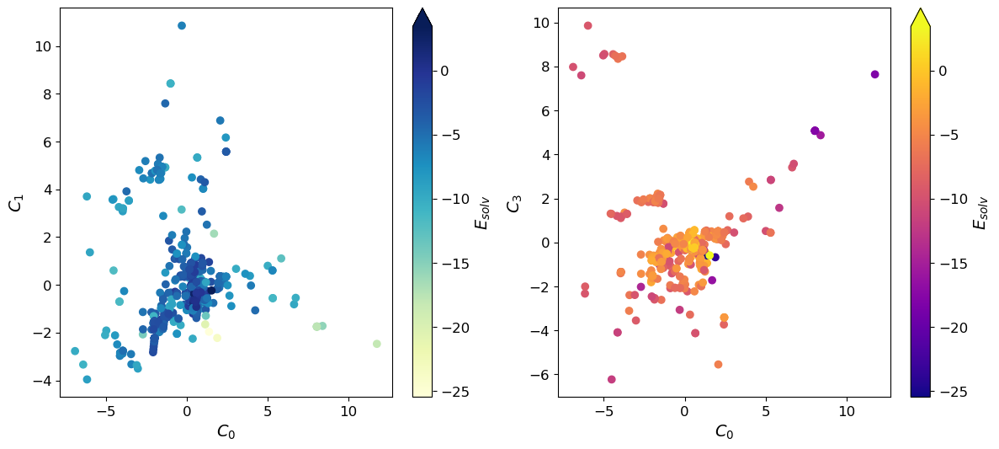

In [9]:
X_solv_scaled = StandardScaler().fit_transform(X_solv) #scales the data
pca = PCA(n_components = 0.90) #fit 90% variance
X_90 = pca.fit_transform(X_solv_scaled) #fit

print(pca.explained_variance_ratio_, len(pca.explained_variance_ratio_), 'axes needed to explain 90% variance')

#plotting the graphs
plt.figure(figsize = (14, 6))

#subplot 1
plt.subplot(121)
a = plt.scatter(X_90[:, 0], X_90[:, 1], c=y_solv, cmap='YlGnBu', vmin=np.amin(y_solv), vmax=np.amax(y_solv), label = '')

plt.colorbar(a, extend='max', label = '$E_{solv}$')
plt.xlabel('$C_0$')
plt.ylabel('$C_1$')

#subplot 2
plt.subplot(122)
b = plt.scatter(X_90[:, 0], X_90[:, 3], c=y_solv, cmap='plasma', vmin=np.amin(y_solv), vmax=np.amax(y_solv), label = '')

plt.colorbar(b, extend='max', label = '$E_{solv}$')
plt.xlabel('$C_0$')
plt.ylabel('$C_3$')
plt.show()

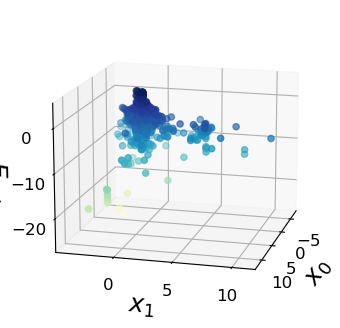

In [10]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
import numpy as np

#3D plot
fig = plt.figure(figsize = (15, 4))

ax = fig.add_subplot(131, projection = '3d')

ax.scatter(X_90[:, 0], X_90[:, 1], y_solv, c = y_solv, cmap = 'YlGnBu')

ax.set_xlabel('$x_0$', fontsize = 18)
ax.set_ylabel('$x_1$', fontsize = 18)
ax.set_zlabel('$E_{solv}$', fontsize = 18)

ax.view_init(15, 15)

plt.show()

In [14]:
X_90

array([[-1.56931302, -0.87278819,  1.38953463, ...,  0.03591955,
         0.08253513, -0.90369161],
       [ 0.53122631, -0.34589259, -0.86591594, ...,  0.16858772,
        -0.07455092, -0.0449465 ],
       [ 0.46387076, -0.50564405, -0.89754888, ...,  1.28010756,
        -0.22900605,  0.30606422],
       ...,
       [-3.57087604,  3.52582923, -0.50551919, ..., -1.24793423,
         1.80385979, -0.78674686],
       [ 0.55707293, -0.70672245, -1.1770931 , ..., -1.36717862,
        -1.61370086,  0.19701391],
       [-0.06700716, -0.46501402, -0.92578537, ...,  0.22719038,
        -0.2241306 ,  0.09126664]])

In [16]:
col_names = range(len(pca.explained_variance_ratio_))
col_names = [f'c{x}' for x in col_names]
X_90_df = pd.DataFrame(X_90, columns = col_names)
X_90_df

,c0,c1,c2,c3,c4,c5,c6,c7,c8,c9,...,c22,c23,c24,c25,c26,c27,c28,c29,c30,c31
0,-1.569313,-0.872788,1.389535,-1.006062,1.124745,0.063690,-1.717702,-0.192383,0.703662,0.077610,...,0.075599,-0.000868,-0.082961,-0.166442,-0.400786,-0.546043,0.481859,0.035920,0.082535,-0.903692
1,0.531226,-0.345893,-0.865916,-0.030272,-0.385417,-0.110286,0.035447,0.161126,-0.216139,-0.254713,...,0.021231,-0.010795,-0.013633,-0.015354,0.029665,0.044420,-0.236234,0.168588,-0.074551,-0.044946
2,0.463871,-0.505644,-0.897549,-0.126116,-0.316090,-0.138977,0.050486,0.159178,-0.439567,-0.070310,...,0.219700,0.122706,0.131013,0.040117,-0.030629,-0.500667,-0.679342,1.280108,-0.229006,0.306064
3,2.443204,0.341773,1.101070,0.454047,0.395873,-1.296784,-0.288881,0.532432,-1.161179,-1.117394,...,0.215771,0.028107,0.028599,-0.066884,0.095693,0.028658,0.196651,0.236128,-0.411234,0.143565
4,0.659737,-1.032383,-1.726640,-0.302446,-0.543794,-1.563680,1.357193,-1.270508,0.613626,1.460873,...,-0.166415,-0.043233,-0.010273,-0.008393,0.015155,-0.102535,0.013107,-1.394741,-1.356934,0.146701
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
637,-2.045006,-1.862335,-0.036887,-0.818013,1.489456,-0.604914,-1.218551,-0.798753,2.094731,-1.194040,...,-0.311844,0.116829,0.016308,-0.240974,0.158334,0.381384,0.067641,-0.915002,-1.763117,0.044792
638,1.258461,-0.562319,-0.065984,0.493257,0.345900,-0.065666,0.187296,0.002636,0.132819,-0.018060,...,-0.028996,0.090830,0.055166,0.027686,0.056950,0.081335,-0.189880,0.231486,-0.305912,-0.096786
639,-3.570876,3.525829,-0.505519,1.296536,3.920124,-0.452080,0.198558,0.372472,-1.179849,1.563848,...,0.678735,-0.465135,-0.377851,-0.238654,0.034167,-0.192846,0.879635,-1.247934,1.803860,-0.786747
640,0.557073,-0.706722,-1.177093,-0.264435,-0.481588,-0.248245,0.008402,0.023756,-0.291338,-0.122017,...,-0.111065,-0.022796,-0.025994,-0.058142,0.118196,-0.100088,-0.011236,-1.367179,-1.613701,0.197014


In [19]:
big_plot = sbs.pairplot(X_90_df, diag_kind='kde')

In [21]:
fig = big_plot.fig
fig.savefig("out.png")

In [22]:
#sklearn correlations of solvE with RDKit values (all)

data = freesolv.copy()
data['solvE'] = solvE.tolist()
corr = data.corr(numeric_only = True)
solvE_corr_list = np.abs(corr['solvE']).sort_values(ascending = False)[1:11]
solvE_corr_list

TPSA                   0.736449
NumHDonors             0.690272
NHOHCount              0.660130
NOCount                0.659624
PEOE_VSA1              0.615710
MinPartialCharge       0.606448
NumHAcceptors          0.606318
MaxAbsPartialCharge    0.568906
SlogP_VSA2             0.557018
MaxEStateIndex         0.515843
Name: solvE, dtype: float64

In [23]:
#sklearn correlations of solvE with only the functional groups

data_FG = freesolv.copy().iloc[:,124:]
data_FG['solvE'] = solvE.tolist()
corr_FG = data_FG.corr()
solvE_corr_list_FG = np.abs(corr_FG['solvE']).sort_values(ascending = False)[0:11] #absolute values of correlation
solvE_corr_list_FG

solvE              1.000000
fr_NH1             0.400675
fr_Ar_NH           0.383792
fr_Nhpyrrole       0.383792
fr_Ar_N            0.381694
fr_Al_OH_noTert    0.365747
fr_Al_OH           0.363582
fr_NH0             0.275689
fr_C_O             0.267567
fr_Ar_OH           0.242302
fr_phenol          0.242302
Name: solvE, dtype: float64

### Plotting Functional Groups against PCA
Want to map the locations of the functional groups on the graphs generated. See if the FGs are cleanly separated or not.

In [13]:
#Cleaning up FG data
functional_groups_RDK = freesolv.iloc[:,124:].loc[:, (freesolv != 0).any(axis=0)].copy()

Method 1: sort by sum of functional group count in each column

In [14]:
s = functional_groups_RDK.sum().sort_values(ascending=False, inplace=False) #sort
FGRDK_sort_sum = functional_groups_RDK[s.index[:10]].copy()
FGRDK_sort_sum

,fr_halogen,fr_benzene,fr_alkyl_halide,fr_unbrch_alkane,fr_ether,fr_C_O,fr_C_O_noCOO,fr_NH0,fr_aryl_methyl,fr_bicyclic
0,0,1,0,0,1,1,1,1,0,0
1,1,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,2,1,0
4,0,0,0,3,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
637,0,0,0,3,1,1,1,0,0,0
638,0,0,0,0,0,0,0,0,0,0
639,0,1,0,0,0,1,1,0,0,0
640,1,0,1,3,0,0,0,0,0,0


Method 2: sort by number of nonzero entries in each column.

In [15]:
s2 = pd.Series(index=functional_groups_RDK.columns, data=np.count_nonzero(functional_groups_RDK, axis=0)).sort_values(ascending=False, inplace=False)
FGRDK_sort_count = functional_groups_RDK[s2.index[:10]].copy()
FGRDK_sort_count

,fr_benzene,fr_halogen,fr_C_O,fr_C_O_noCOO,fr_ether,fr_NH0,fr_alkyl_halide,fr_unbrch_alkane,fr_aryl_methyl,fr_methoxy
0,1,0,1,1,1,1,0,0,0,1
1,0,1,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,2,0,0,1,0
4,0,0,0,0,0,0,0,3,0,0
...,...,...,...,...,...,...,...,...,...,...
637,0,0,1,1,1,0,0,3,0,1
638,0,0,0,0,0,0,0,0,0,0
639,1,0,1,1,0,0,0,0,0,0
640,0,1,0,0,0,0,1,3,0,0


Time to plot. Alpha is lowered so that overlapping points are visible.

Text(0, 0.5, '$E_{solv}$')

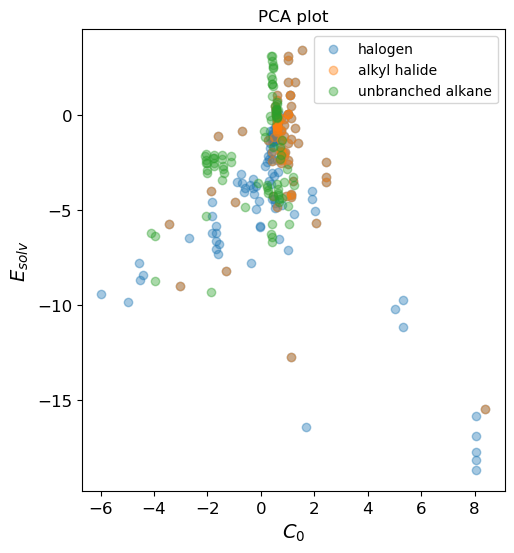

In [16]:
plt.figure(figsize = (12, 6))

plt.subplot(121)

plt.scatter(X_90[:, 0][FGRDK_sort_sum.iloc[:,0] > 0], y_solv[FGRDK_sort_sum.iloc[:,0] > 0], alpha = 0.4, label = 'halogen')
#plt.scatter(X_90[:, 0][FGRDK_sort_sum.iloc[:,1] > 0], y_solv[FGRDK_sort_sum.iloc[:,1] > 0], alpha = 0.4, label = 'benzene')
plt.scatter(X_90[:, 0][FGRDK_sort_sum.iloc[:,2] > 0], y_solv[FGRDK_sort_sum.iloc[:,2] > 0], alpha = 0.4, label = 'alkyl halide')
plt.scatter(X_90[:, 0][FGRDK_sort_sum.iloc[:,3] > 0], y_solv[FGRDK_sort_sum.iloc[:,3] > 0], alpha = 0.4, label = 'unbranched alkane')
#plt.scatter(X_90[:, 0][FGRDK_sort_sum.iloc[:,4] > 0], y_solv[FGRDK_sort_sum.iloc[:,4] > 0], alpha = 0.4, label = 'ether')

plt.legend(loc = 'best', shadow = False, scatterpoints = 1)
plt.title('PCA plot')
plt.xlabel('$C_0$')
plt.ylabel('$E_{solv}$')

Can see above that alkyl halides (orange) always overlap with halogen (blue), thus creating a brownish colour.

[]

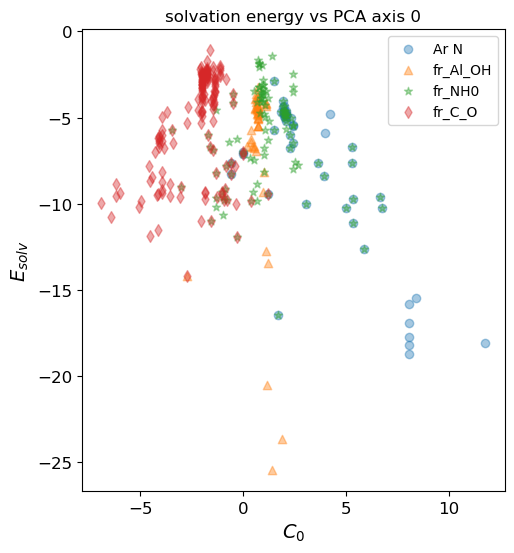

In [17]:
plt.figure(figsize = (12, 6))

plt.subplot(121)

#plt.scatter(X_90[:, 0][functional_groups_RDK.fr_NH1 > 0], y_solv[functional_groups_RDK.fr_NH1 > 0], alpha = 0.4, label = 'NH1')
plt.scatter(X_90[:, 0][functional_groups_RDK.fr_Ar_N > 0], y_solv[functional_groups_RDK.fr_Ar_N > 0], alpha = 0.4, marker = "o", label = 'Ar N')
#plt.scatter(X_90[:, 0][functional_groups_RDK.fr_Nhpyrrole > 0], y_solv[functional_groups_RDK.fr_Nhpyrrole > 0], alpha = 0.4, label = 'NH Pyrrole')
#plt.scatter(X_90[:, 0][functional_groups_RDK.fr_Al_OH_noTert > 0], y_solv[functional_groups_RDK.fr_Al_OH_noTert > 0], alpha = 0.4, label = 'Al OH noTert')
plt.scatter(X_90[:, 0][functional_groups_RDK.fr_Al_OH > 0], y_solv[functional_groups_RDK.fr_Al_OH > 0], alpha = 0.4, marker = "^", label = 'fr_Al_OH')
plt.scatter(X_90[:, 0][functional_groups_RDK.fr_NH0 > 0], y_solv[functional_groups_RDK.fr_NH0 > 0], alpha = 0.4, marker = "*", label = 'fr_NH0')
plt.scatter(X_90[:, 0][functional_groups_RDK.fr_C_O > 0], y_solv[functional_groups_RDK.fr_C_O > 0], alpha = 0.4, marker = "d", label = 'fr_C_O')

plt.legend(loc = 'best', shadow = False, scatterpoints = 1)
plt.title('solvation energy vs PCA axis 0')
plt.xlabel('$C_0$')
plt.ylabel('$E_{solv}$')
plt.plot()

[]

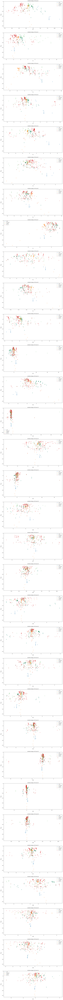

In [133]:
num_axes = len(pca.explained_variance_ratio_)
fig, axs = plt.subplots(nrows = num_axes, figsize=(15, 256))

for x in range(num_axes):
    axs[x].scatter(X_90[:, x][functional_groups_RDK.fr_Ar_N > 0], y_solv[functional_groups_RDK.fr_Ar_N > 0], alpha = 0.4, marker = "o", label = 'Ar N')
    axs[x].scatter(X_90[:, x][functional_groups_RDK.fr_Al_OH > 0], y_solv[functional_groups_RDK.fr_Al_OH > 0], alpha = 0.4, marker = "^", label = 'fr_Al_OH')
    axs[x].scatter(X_90[:, x][functional_groups_RDK.fr_NH0 > 0], y_solv[functional_groups_RDK.fr_NH0 > 0], alpha = 0.4, marker = "*", label = 'fr_NH0')
    axs[x].scatter(X_90[:, x][functional_groups_RDK.fr_C_O > 0], y_solv[functional_groups_RDK.fr_C_O > 0], alpha = 0.4, marker = "d", label = 'fr_C_O')
    axs[x].legend(loc = 'best', shadow = False, scatterpoints = 1)
    axs[x].set(xlabel = f'$C_{x}$', ylabel = '$E_{solv}$', title = f'solvation energy vs PCA axis {x}')
    
plt.plot()


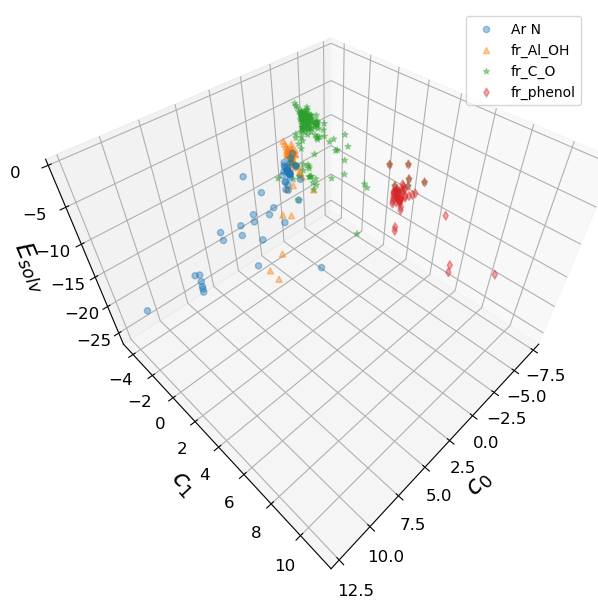

In [18]:
#3D plot
fig = plt.figure(figsize = (15, 12))

ax = fig.add_subplot(121, projection = '3d')

ax.scatter(X_90[:, 0][functional_groups_RDK.fr_Ar_N > 0], X_90[:, 1][functional_groups_RDK.fr_Ar_N > 0], y_solv[functional_groups_RDK.fr_Ar_N > 0], alpha = 0.4, marker = "o", label = 'Ar N')
ax.scatter(X_90[:, 0][functional_groups_RDK.fr_Al_OH > 0], X_90[:, 1][functional_groups_RDK.fr_Al_OH > 0], y_solv[functional_groups_RDK.fr_Al_OH > 0], alpha = 0.4, marker = "^", label = 'fr_Al_OH')
ax.scatter(X_90[:, 0][functional_groups_RDK.fr_C_O > 0], X_90[:, 1][functional_groups_RDK.fr_C_O > 0], y_solv[functional_groups_RDK.fr_C_O > 0], alpha = 0.4, marker = "*", label = 'fr_C_O')
ax.scatter(X_90[:, 0][functional_groups_RDK.fr_phenol > 0], X_90[:, 1][functional_groups_RDK.fr_phenol > 0], y_solv[functional_groups_RDK.fr_phenol > 0], alpha = 0.4, marker = "d", label = 'fr_phenol')

ax.set_xlabel('$c_0$', fontsize = 18)
ax.set_ylabel('$c_1$', fontsize = 18)
ax.set_zlabel('$E_{solv}$', fontsize = 18)
ax.legend(loc = 'best', shadow = False, scatterpoints = 1)
ax.view_init(45, 45)
ax.set_proj_type('persp', focal_length = 0.2)

plt.show()

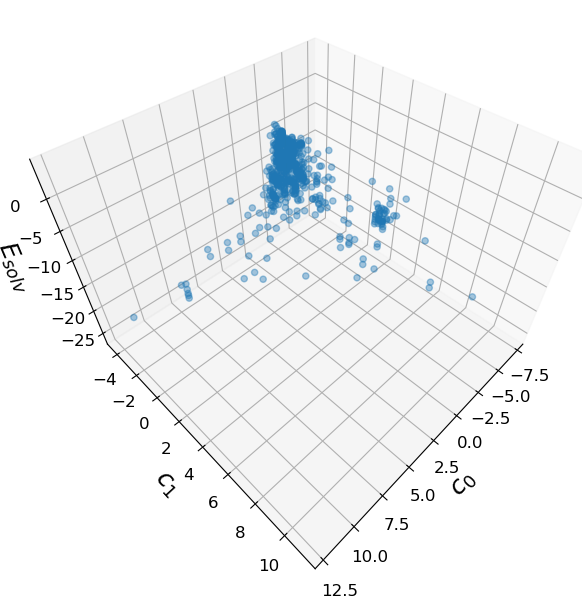

In [45]:
fig = plt.figure(figsize = (15, 12))

ax = fig.add_subplot(121, projection = '3d')

ax.scatter(X_90[:, 0], X_90[:, 1], y_solv, alpha = 0.4, marker = "o")

ax.set_xlabel('$c_0$', fontsize = 18)
ax.set_ylabel('$c_1$', fontsize = 18)
ax.set_zlabel('$E_{solv}$', fontsize = 18)
#ax.legend(loc = 'best', shadow = False, scatterpoints = 1)
ax.view_init(45, 45)
ax.set_proj_type('persp', focal_length = 0.2)

plt.show()

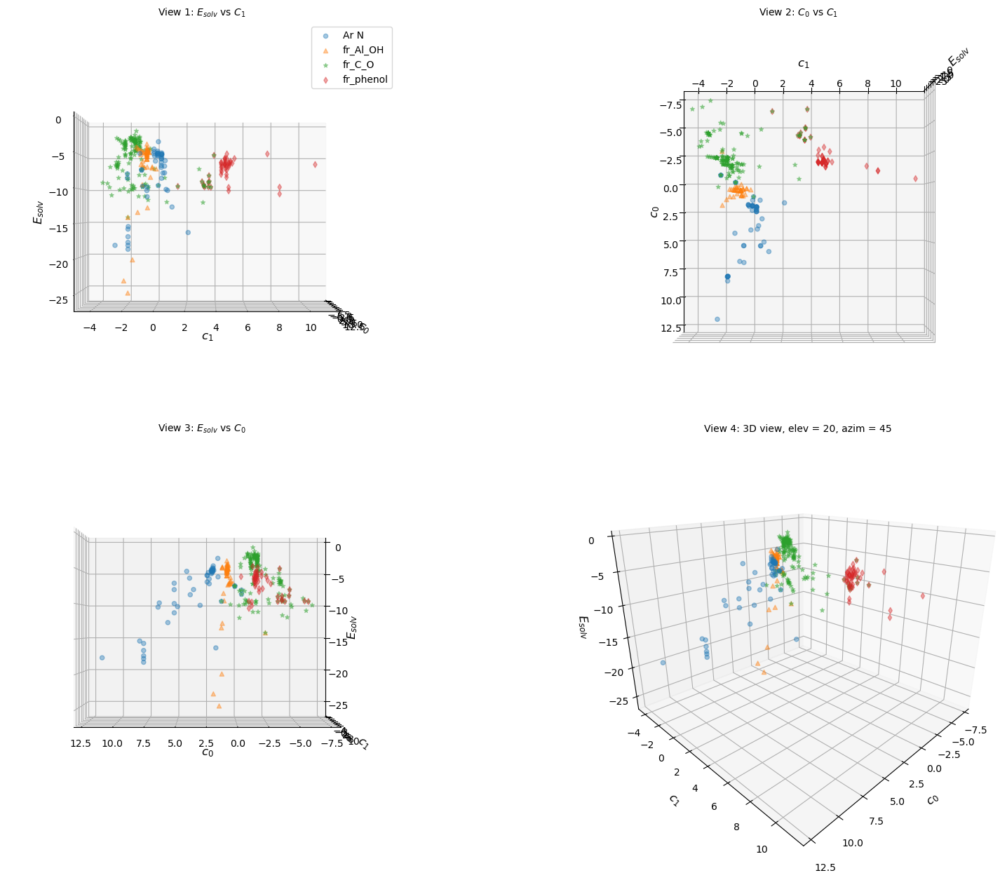

In [25]:
#more 3D plots
SMALL_SIZE = 10
MEDIUM_SIZE = 12
BIGGER_SIZE = 14

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

fig, axs = plt.subplots(2, 2, subplot_kw={'projection': '3d'}, figsize=(20, 12))

for ax in axs.flat:
    ax.scatter(X_90[:, 0][functional_groups_RDK.fr_Ar_N > 0], X_90[:, 1][functional_groups_RDK.fr_Ar_N > 0], y_solv[functional_groups_RDK.fr_Ar_N > 0], alpha = 0.4, marker = "o", label = 'Ar N')
    ax.scatter(X_90[:, 0][functional_groups_RDK.fr_Al_OH > 0], X_90[:, 1][functional_groups_RDK.fr_Al_OH > 0], y_solv[functional_groups_RDK.fr_Al_OH > 0], alpha = 0.4, marker = "^", label = 'fr_Al_OH')
    ax.scatter(X_90[:, 0][functional_groups_RDK.fr_C_O > 0], X_90[:, 1][functional_groups_RDK.fr_C_O > 0], y_solv[functional_groups_RDK.fr_C_O > 0], alpha = 0.4, marker = "*", label = 'fr_C_O')
    ax.scatter(X_90[:, 0][functional_groups_RDK.fr_phenol > 0], X_90[:, 1][functional_groups_RDK.fr_phenol > 0], y_solv[functional_groups_RDK.fr_phenol > 0], alpha = 0.4, marker = "d", label = 'fr_phenol')
    ax.set(xlabel='$c_0$', ylabel='$c_1$', zlabel = '$E_{solv}$')

axs[0, 0].view_init(0, 0)
axs[0, 0].set_title('View 1: $E_{solv}$ vs $C_1$')
axs[0, 1].view_init(90, 0)
axs[0, 1].set_title('View 2: $C_0$ vs $C_1$')
axs[1, 0].view_init(0, 90)
axs[1, 0].set_title('View 3: $E_{solv}$ vs $C_0$')
axs[1, 1].view_init(20, 45)
axs[1, 1].set_title('View 4: 3D view, elev = 20, azim = 45')
axs[1, 1].set_proj_type('persp', focal_length = 0.2)

axs[0,0].legend(loc = 'best', shadow = False, scatterpoints = 1)

fig.tight_layout()
plt.show()

In [33]:
for x in range(5):
    print(s2.index[x])

fr_benzene
fr_halogen
fr_C_O
fr_C_O_noCOO
fr_ether


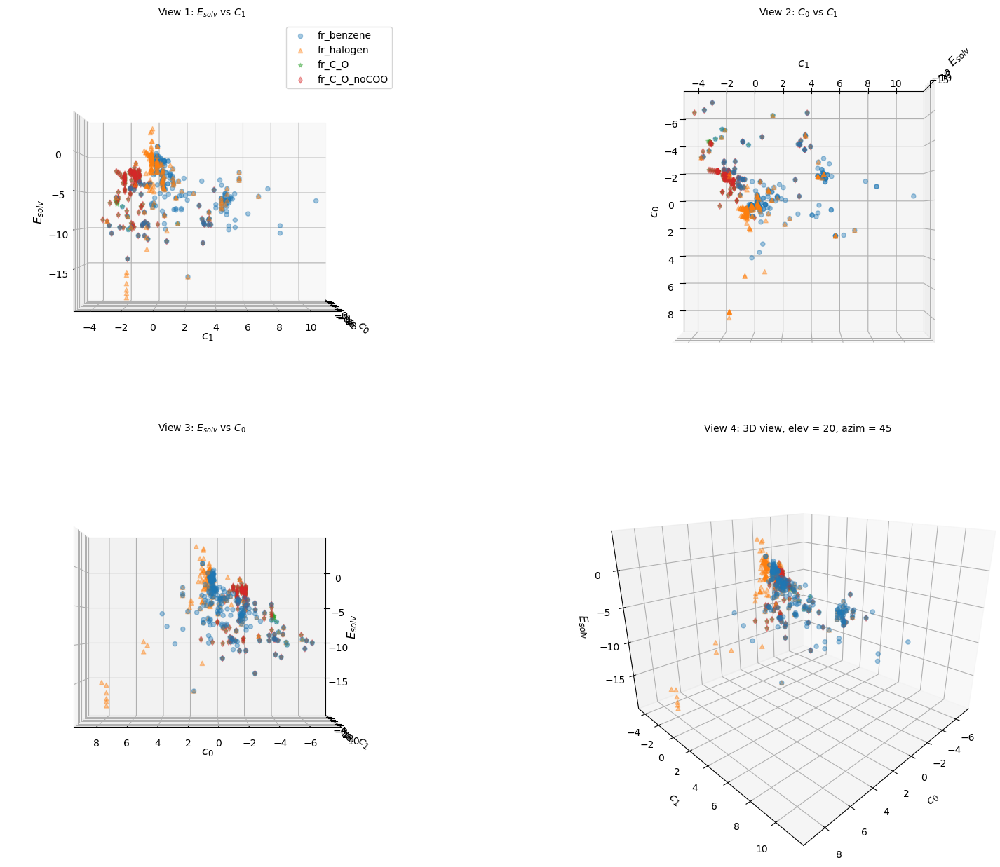

In [41]:
import itertools
marker = itertools.cycle(('o', '^', '*', 'd'
                          #, ','
                         )) 

fig, axs = plt.subplots(2, 2, subplot_kw={'projection': '3d'}, figsize=(20, 12))

for ax in axs.flat:
    ax.set_prop_cycle = marker_cycler
    for x in range(4):
        name = s2.index[x] #name of FG column saved as string
        ax.scatter(X_90[:, 0][functional_groups_RDK[f'{name}'] > 0], X_90[:, 1][functional_groups_RDK[f'{name}'] > 0], y_solv[functional_groups_RDK[f'{name}'] > 0], alpha = 0.4, marker = next(marker), label = f'{name}')
    ax.set(xlabel='$c_0$', ylabel='$c_1$', zlabel = '$E_{solv}$')

axs[0, 0].view_init(0, 0)
axs[0, 0].set_title('View 1: $E_{solv}$ vs $C_1$')
axs[0, 1].view_init(90, 0)
axs[0, 1].set_title('View 2: $C_0$ vs $C_1$')
axs[1, 0].view_init(0, 90)
axs[1, 0].set_title('View 3: $E_{solv}$ vs $C_0$')
axs[1, 1].view_init(20, 45)
axs[1, 1].set_title('View 4: 3D view, elev = 20, azim = 45')
axs[1, 1].set_proj_type('persp', focal_length = 0.2)

axs[0,0].legend(loc = 'best', shadow = False, scatterpoints = 1)

fig.tight_layout()
plt.show()

### Doing Clustering on PCA

In [48]:
# KMeans & silhouette scores
range_of_ks = range(1,40)
kmeans_per_k = [KMeans(n_clusters = k).fit(X_solv_scaled) for k in range_of_ks]

inertias = [model.inertia_ for model in kmeans_per_k]

silhouette_scores = [silhouette_score(X_solv_scaled, model.labels_)
                     for model in kmeans_per_k[1:]]

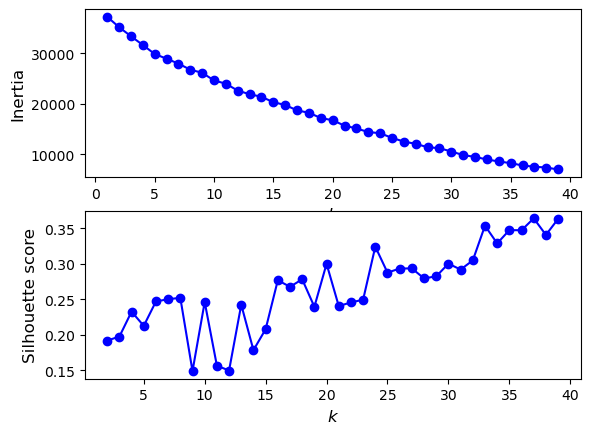

<Figure size 800x800 with 0 Axes>

In [55]:
fig, axs = plt.subplots(2)
plt.figure(figsize = (8, 8))

#Inertia subplot

axs[0].plot(range_of_ks, inertias, 'bo-')
axs[0].set(xlabel='$k$', ylabel='Inertia')

#silhouette score subplot
axs[1].plot(range_of_ks[1:], silhouette_scores, 'bo-')
axs[1].set(xlabel='$k$', ylabel='Silhouette score')

plt.show()

Above results show that K-Means clustering is not very successful. Inertia doesn't produce a clear elbow point and silhouette score doesn't stabilise.

In [53]:
#DBSCAN CLUSTERING

#make the 3d array
dbscan_input_array = np.stack( (X_90[:, 0], X_90[:, 1], y_solv), axis = 1)


number of cluster found: 5
cluster for each point:  [ 0  0  0  0  0  1  0  0  0  0  0  0  0  0  0  0  0  0  1  0  2  0  0  0
  0  0  0  0  0  0  0  0 -1  0  0  1  0  0  0  0  0  0  1  0 -1  0 -1  0
  0  0  0  0  1  1  0  0  0  0 -1  0  0  0  0  3  0  0 -1  0  0  0  0 -1
  0  0  0  0  0  0  0  1  0  0  0 -1  0  0  0  0  0 -1  0 -1  0  0  0  0
  0  0  2  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 -1  0
  0 -1  0  0  1  0  0  0  1  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  1  0  0  0 -1  0  0 -1  0  0  2  2  0  0  0  0  2  0  0  0  0
  0  0  0 -1  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 -1
  0  0  0  0  0 -1  3  0  0  2  0  0  0  0  0  0  0  1  0  0 -1  2  0 -1
  0  0  0  0  0  0  0  0  0  0  0 -1  0  0  0  0  0  0  0  0  0  0  3  0
  0  0  0  0  1  1 -1 -1  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0 -1 -1  0  0  0  0  0  0  0  0  3  0  0  0  0  0  0  2  0  0  0  0
  0  0  0  0  0  1  0  0  0  3  0  0  1  0  0  0  0  0  0  0  0  0  0  0

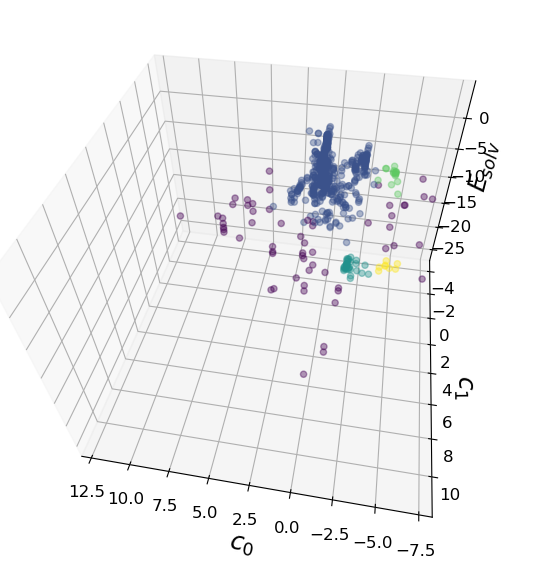

In [61]:
model = DBSCAN(eps = 1.5, min_samples=5)
model.fit_predict(dbscan_input_array)
pred = model.fit_predict(dbscan_input_array)

print("number of cluster found: {}".format(len(set(model.labels_))))
print('cluster for each point: ', model.labels_)


fig = plt.figure(figsize = (15, 12))

ax = fig.add_subplot(121, projection = '3d')

ax.scatter(dbscan_input_array[:, 0], dbscan_input_array[:, 1], dbscan_input_array[:, 2], alpha = 0.4, marker = "o", c=model.labels_)

ax.set_xlabel('$c_0$', fontsize = 18)
ax.set_ylabel('$c_1$', fontsize = 18)
ax.set_zlabel('$E_{solv}$', fontsize = 18)
#ax.legend(loc = 'best', shadow = False, scatterpoints = 1)
ax.view_init(45, 100)
ax.set_proj_type('persp', focal_length = 0.2)

plt.show()

number of cluster found: 5
cluster for each point:  [2 0 4 0 0 3 4 0 4 0 4 0 0 1 4 0 4 0 3 4 1 0 0 1 0 0 0 1 1 2 4 4 2 2 0 3 1
 0 1 4 2 4 3 4 2 1 3 0 0 3 1 0 3 3 4 4 2 0 2 0 0 0 1 3 4 4 2 4 4 2 4 2 0 1
 2 0 1 0 4 3 0 4 0 2 4 4 4 4 4 2 0 2 4 0 0 0 0 4 1 0 4 4 0 0 0 1 4 4 1 0 1
 4 1 2 4 1 1 0 3 0 4 2 0 1 3 0 0 4 3 4 4 0 1 0 4 0 0 4 0 0 4 0 4 0 1 1 4 3
 4 4 4 2 2 4 2 1 0 1 1 0 4 2 0 1 1 1 4 4 4 0 0 2 1 0 4 1 1 4 2 0 4 0 0 0 0
 4 0 1 4 4 0 2 0 4 4 4 1 2 3 1 1 1 4 0 0 0 4 4 4 3 0 0 2 1 0 2 1 0 4 1 1 0
 0 1 1 0 0 2 1 0 0 0 0 0 4 4 0 2 3 0 4 1 0 2 3 3 3 2 1 0 1 3 4 1 2 4 0 4 0
 1 4 4 0 4 0 4 2 2 4 0 4 4 1 0 4 0 3 0 4 3 2 4 1 1 4 4 4 4 4 4 0 4 0 3 0 4
 1 3 0 1 3 4 4 4 0 0 4 1 3 0 0 2 0 0 0 1 4 4 1 4 3 4 4 3 2 3 0 4 2 4 4 0 4
 0 3 0 3 4 4 4 4 4 1 4 2 1 0 1 0 0 0 0 0 4 0 1 0 3 0 1 3 1 2 4 2 3 3 4 0 0
 4 4 0 4 0 2 0 2 0 0 1 4 4 0 0 4 4 3 1 2 3 1 1 2 3 4 0 3 3 3 0 4 1 0 3 3 3
 3 4 2 0 1 4 2 3 4 2 1 1 0 1 2 1 0 4 0 0 0 2 0 0 0 0 1 4 0 3 0 4 1 0 2 4 2
 1 0 4 4 0 2 3 1 0 4 4 4 0 1 0 3 1 1 3 4 3 3 0 3

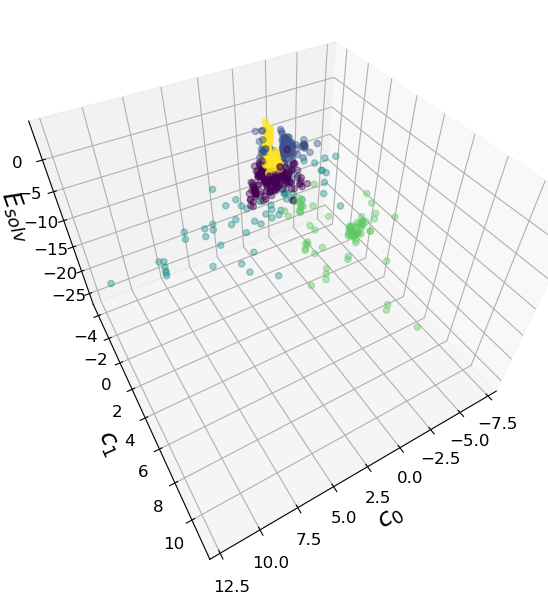

In [73]:
model = GaussianMixture(5)
model.fit(dbscan_input_array).predict(dbscan_input_array)
pred = model.fit(dbscan_input_array).predict(dbscan_input_array)

print("number of cluster found: {}".format(len(set(pred))))
print('cluster for each point: ', pred)


fig = plt.figure(figsize = (15, 12))

ax = fig.add_subplot(121, projection = '3d')

ax.scatter(dbscan_input_array[:, 0], dbscan_input_array[:, 1], dbscan_input_array[:, 2], alpha = 0.4, marker = "o", c=pred)

ax.set_xlabel('$c_0$', fontsize = 18)
ax.set_ylabel('$c_1$', fontsize = 18)
ax.set_zlabel('$E_{solv}$', fontsize = 18)
#ax.legend(loc = 'best', shadow = False, scatterpoints = 1)
ax.view_init(45, 60)
ax.set_proj_type('persp', focal_length = 0.2)

plt.show()

In [74]:
# KMeans & silhouette scores
range_of_ks = range(1,20)
kmeans_per_k = [KMeans(n_clusters = k).fit(dbscan_input_array) for k in range_of_ks]

inertias = [model.inertia_ for model in kmeans_per_k]

silhouette_scores = [silhouette_score(dbscan_input_array, model.labels_)
                     for model in kmeans_per_k[1:]]

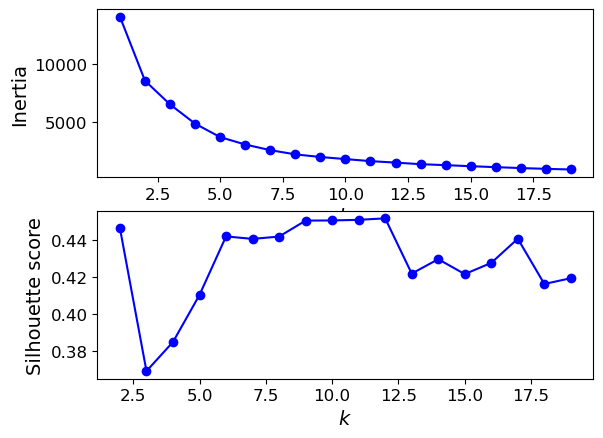

<Figure size 800x800 with 0 Axes>

In [75]:
fig, axs = plt.subplots(2)
plt.figure(figsize = (8, 8))

#Inertia subplot

axs[0].plot(range_of_ks, inertias, 'bo-')
axs[0].set(xlabel='$k$', ylabel='Inertia')

#silhouette score subplot
axs[1].plot(range_of_ks[1:], silhouette_scores, 'bo-')
axs[1].set(xlabel='$k$', ylabel='Silhouette score')

plt.show()

number of cluster found: 6
cluster for each point:  [3 2 5 2 2 0 5 2 5 2 5 2 2 1 2 2 5 2 0 5 1 2 2 1 2 2 2 1 1 3 5 5 3 3 2 0 1
 2 1 5 3 5 0 5 4 1 0 2 2 2 5 2 0 0 5 5 3 2 4 2 2 2 5 0 5 5 4 5 2 3 5 3 3 1
 2 2 5 2 5 0 2 5 2 4 5 5 5 5 5 4 2 4 2 1 2 5 2 5 1 2 5 5 2 2 5 5 5 5 1 1 1
 5 1 3 2 1 5 2 0 2 5 4 2 5 0 2 2 5 0 5 5 2 5 2 5 2 2 5 2 2 5 2 5 2 1 5 2 0
 5 5 5 2 3 5 4 1 2 1 1 2 5 2 2 1 1 1 5 5 2 2 2 4 1 2 5 1 1 5 3 1 5 2 5 2 2
 5 2 1 5 5 2 3 2 5 5 5 5 2 0 1 1 1 5 2 2 2 5 5 5 0 2 1 4 1 5 4 5 2 5 1 1 5
 2 1 1 2 2 3 1 2 2 2 2 2 5 5 2 3 0 2 5 1 5 3 0 0 0 3 1 2 1 2 5 5 3 5 2 5 2
 5 5 5 1 5 2 5 2 3 5 2 5 5 1 2 5 2 0 2 5 0 3 5 1 1 5 5 5 5 5 5 2 5 2 0 2 5
 1 0 2 1 0 5 5 5 2 2 5 1 3 3 2 3 2 2 2 1 5 5 1 5 0 5 5 0 3 0 2 2 3 5 5 2 5
 2 0 2 0 5 5 5 5 5 1 5 3 1 2 1 2 3 2 2 2 5 2 1 2 0 2 1 0 1 4 5 3 2 2 5 2 2
 5 5 2 5 2 1 2 3 2 2 1 5 5 2 2 5 5 0 5 2 0 1 1 2 3 5 2 2 0 2 5 5 1 2 0 0 0
 0 5 3 2 1 5 3 0 5 3 1 1 1 1 2 1 2 5 2 2 5 4 2 2 2 2 1 5 2 0 2 5 5 2 3 5 3
 3 5 5 2 5 4 2 1 2 5 5 5 2 1 2 0 1 1 0 5 0 0 2 0

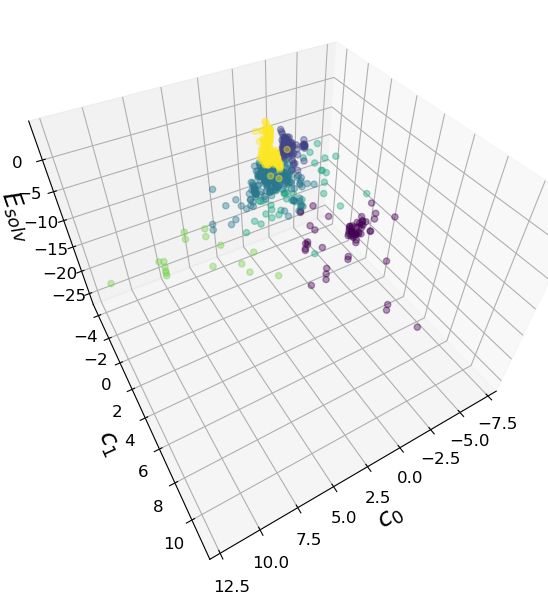

In [78]:
model = KMeans(6)
model.fit(dbscan_input_array).predict(dbscan_input_array)
pred = model.fit(dbscan_input_array).predict(dbscan_input_array)

print("number of cluster found: {}".format(len(set(model.labels_))))
print('cluster for each point: ', model.labels_)


fig = plt.figure(figsize = (15, 12))

ax = fig.add_subplot(121, projection = '3d')

ax.scatter(dbscan_input_array[:, 0], dbscan_input_array[:, 1], dbscan_input_array[:, 2], alpha = 0.4, marker = "o", c=pred)

ax.set_xlabel('$c_0$', fontsize = 18)
ax.set_ylabel('$c_1$', fontsize = 18)
ax.set_zlabel('$E_{solv}$', fontsize = 18)
#ax.legend(loc = 'best', shadow = False, scatterpoints = 1)
ax.view_init(45, 60)
ax.set_proj_type('persp', focal_length = 0.2)

plt.show()

### Other Dimensionality Reduction Methods

In [93]:
from sklearn.manifold import TSNE, Isomap, MDS, LocallyLinearEmbedding
tsne = TSNE(learning_rate='auto', init='pca').fit_transform(X_solv_scaled)

/Users/ansoncherk/mambaforge/envs/my_tf_env_3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:996: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


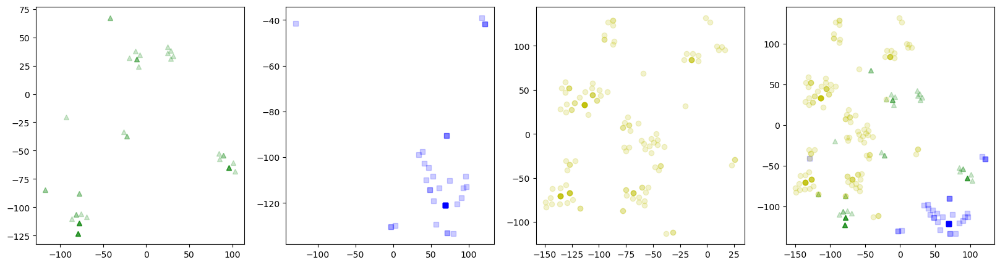

In [96]:
plt.figure(figsize = (20,5))

plt.subplot(141)
plt.plot(tsne[:,0][functional_groups_RDK.fr_Ar_N > 0], tsne[:,1][functional_groups_RDK.fr_Ar_N > 0], 'g^', alpha = 0.2)
#plt.axis([-50, 50, -50, 50])

plt.subplot(142)
plt.plot(tsne[:,0][functional_groups_RDK.fr_Al_OH > 0], tsne[:,1][functional_groups_RDK.fr_Al_OH > 0], 'bs', alpha = 0.2)
#plt.axis([-50, 50, -50, 50])

plt.subplot(143)
plt.plot(tsne[:,0][functional_groups_RDK.fr_C_O > 0], tsne[:,1][functional_groups_RDK.fr_C_O > 0], 'yo', alpha = 0.2)
#plt.axis([-50, 50, -50, 50])

plt.subplot(144)
plt.plot(tsne[:,0][functional_groups_RDK.fr_Ar_N > 0], tsne[:,1][functional_groups_RDK.fr_Ar_N > 0], 'g^', alpha = 0.2)
plt.plot(tsne[:,0][functional_groups_RDK.fr_Al_OH > 0], tsne[:,1][functional_groups_RDK.fr_Al_OH > 0], 'bs', alpha = 0.2)
plt.plot(tsne[:,0][functional_groups_RDK.fr_C_O > 0], tsne[:,1][functional_groups_RDK.fr_C_O > 0], 'yo', alpha = 0.2)
#plt.axis([-50, 50, -50, 50])

plt.show()

MDS: Multidimensional scaling (MDS) seeks a low-dimensional representation of the data in which the distances respect well the distances in the original high-dimensional space.

In general, MDS is a technique used for analyzing similarity or dissimilarity data. It attempts to model similarity or dissimilarity data as distances in a geometric spaces. The data can be ratings of similarity between objects, interaction frequencies of molecules, or trade indices between countries.

In [91]:
mds = MDS(n_components=3).fit_transform(X_solv_scaled)

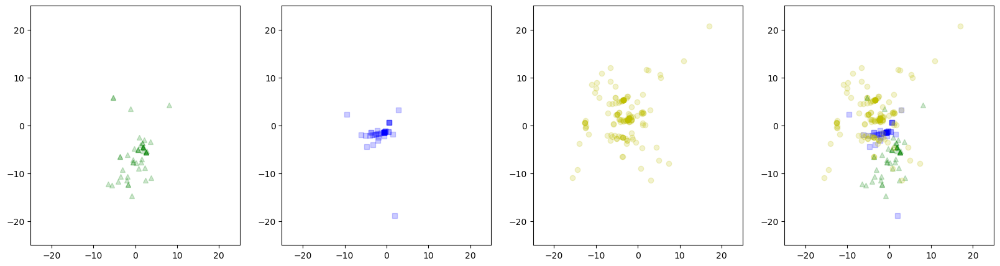

In [92]:
plt.figure(figsize = (20,5))

plt.subplot(141)
plt.plot(mds[:,0][functional_groups_RDK.fr_Ar_N > 0], mds[:,1][functional_groups_RDK.fr_Ar_N > 0], 'g^', alpha = 0.2)
plt.axis([-25, 25, -25, 25])

plt.subplot(142)
plt.plot(mds[:,0][functional_groups_RDK.fr_Al_OH > 0], mds[:,1][functional_groups_RDK.fr_Al_OH > 0], 'bs', alpha = 0.2)
plt.axis([-25, 25, -25, 25])

plt.subplot(143)
plt.plot(mds[:,0][functional_groups_RDK.fr_C_O > 0], mds[:,1][functional_groups_RDK.fr_C_O > 0], 'yo', alpha = 0.2)
plt.axis([-25, 25, -25, 25])

plt.subplot(144)
plt.plot(mds[:,0][functional_groups_RDK.fr_Ar_N > 0], mds[:,1][functional_groups_RDK.fr_Ar_N > 0], 'g^', alpha = 0.2)
plt.plot(mds[:,0][functional_groups_RDK.fr_Al_OH > 0], mds[:,1][functional_groups_RDK.fr_Al_OH > 0], 'bs', alpha = 0.2)
plt.plot(mds[:,0][functional_groups_RDK.fr_C_O > 0], mds[:,1][functional_groups_RDK.fr_C_O > 0], 'yo', alpha = 0.2)
plt.axis([-25, 25, -25, 25])

plt.show()

In [99]:
lle = LocallyLinearEmbedding(#n_components = 2, n_neighbors = 10
                            ).fit_transform(X_solv_scaled)

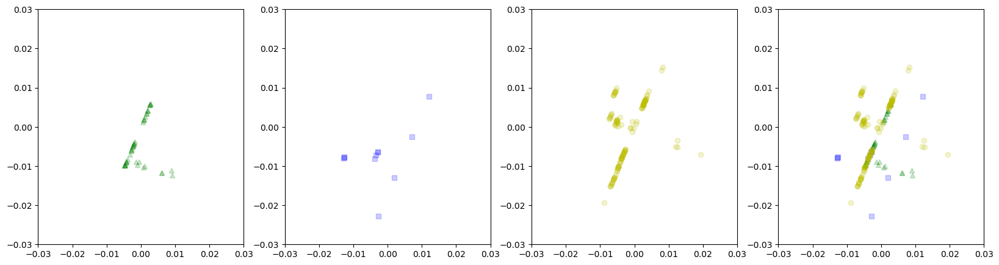

In [100]:
plt.figure(figsize = (20,5))

plt.subplot(141)
plt.plot(lle[:,0][functional_groups_RDK.fr_Ar_N > 0], lle[:,1][functional_groups_RDK.fr_Ar_N > 0], 'g^', alpha = 0.2)
plt.axis([-0.03, 0.03, -0.03, 0.03])

plt.subplot(142)
plt.plot(lle[:,0][functional_groups_RDK.fr_Al_OH > 0], lle[:,1][functional_groups_RDK.fr_Al_OH > 0], 'bs', alpha = 0.2)
plt.axis([-0.03, 0.03, -0.03, 0.03])

plt.subplot(143)
plt.plot(lle[:,0][functional_groups_RDK.fr_C_O > 0], lle[:,1][functional_groups_RDK.fr_C_O > 0], 'yo', alpha = 0.2)
plt.axis([-0.03, 0.03, -0.03, 0.03])

plt.subplot(144)
plt.plot(lle[:,0][functional_groups_RDK.fr_Ar_N > 0], lle[:,1][functional_groups_RDK.fr_Ar_N > 0], 'g^', alpha = 0.2)
plt.plot(lle[:,0][functional_groups_RDK.fr_Al_OH > 0], lle[:,1][functional_groups_RDK.fr_Al_OH > 0], 'bs', alpha = 0.2)
plt.plot(lle[:,0][functional_groups_RDK.fr_C_O > 0], lle[:,1][functional_groups_RDK.fr_C_O > 0], 'yo', alpha = 0.2)
plt.axis([-0.03, 0.03, -0.03, 0.03])

plt.show()

In [82]:
isomap = Isomap().fit_transform(X_solv_scaled)

/Users/ansoncherk/mambaforge/envs/my_tf_env_3/lib/python3.9/site-packages/sklearn/manifold/_isomap.py:348: UserWarning: The number of connected components of the neighbors graph is 8 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/Users/ansoncherk/mambaforge/envs/my_tf_env_3/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/Users/ansoncherk/mambaforge/envs/my_tf_env_3/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/Users/ansoncherk/mambaforge/envs/my_tf_env_3/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a

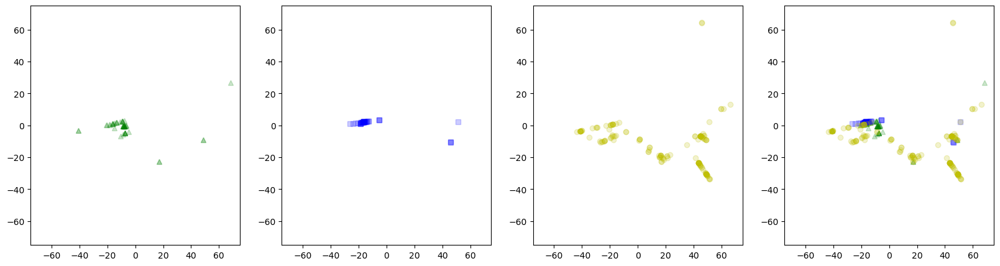

In [83]:
plt.figure(figsize = (20,5))

plt.subplot(141)
plt.plot(isomap[:,0][functional_groups_RDK.fr_Ar_N > 0], isomap[:,1][functional_groups_RDK.fr_Ar_N > 0], 'g^', alpha = 0.2)
plt.axis([-75, 75, -75, 75])

plt.subplot(142)
plt.plot(isomap[:,0][functional_groups_RDK.fr_Al_OH > 0], isomap[:,1][functional_groups_RDK.fr_Al_OH > 0], 'bs', alpha = 0.2)
plt.axis([-75, 75, -75, 75])

plt.subplot(143)
plt.plot(isomap[:,0][functional_groups_RDK.fr_C_O > 0], isomap[:,1][functional_groups_RDK.fr_C_O > 0], 'yo', alpha = 0.2)
plt.axis([-75, 75, -75, 75])

plt.subplot(144)
plt.plot(isomap[:,0][functional_groups_RDK.fr_Ar_N > 0], isomap[:,1][functional_groups_RDK.fr_Ar_N > 0], 'g^', alpha = 0.2)
plt.plot(isomap[:,0][functional_groups_RDK.fr_Al_OH > 0], isomap[:,1][functional_groups_RDK.fr_Al_OH > 0], 'bs', alpha = 0.2)
plt.plot(isomap[:,0][functional_groups_RDK.fr_C_O > 0], isomap[:,1][functional_groups_RDK.fr_C_O > 0], 'yo', alpha = 0.2)
plt.axis([-75, 75, -75, 75])

plt.show()

### Clustering with solvE (PCA, manifold, etc)
Same process but now solvE is included.

In [107]:
X_solv_everything = pd.concat( [freesolv.iloc[:,:124].select_dtypes(include=numerics), pd.read_csv('datasets/final_project_data_22/freesolv.csv').expt], axis = 1 )


X_solv_everything

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,...,NumHDonors,NumHeteroatoms,NumRotatableBonds,NumSaturatedCarbocycles,NumSaturatedHeterocycles,NumSaturatedRings,RingCount,MolLogP,MolMR,expt
0,11.429183,0.002457,11.429183,0.002457,0.686360,179.219,166.115,179.094629,70,0,...,0,3,2,0,0,0,1,1.3970,51.0115,-11.01
1,9.397377,-3.194444,9.397377,0.925154,0.421427,114.553,111.529,113.954228,32,0,...,0,4,0,0,0,0,0,0.1848,20.6968,-4.87
2,3.560185,0.648148,3.560185,0.648148,0.412737,70.135,60.055,70.078250,30,0,...,0,0,1,0,0,0,0,1.8284,25.0350,1.83
3,4.034722,0.966111,4.034722,0.966111,0.536795,108.144,100.080,108.068748,42,0,...,0,2,1,0,0,0,1,1.0390,31.4100,-5.45
4,8.365587,0.364796,8.365587,0.364796,0.544191,116.204,100.076,116.120115,50,0,...,1,1,5,0,0,0,0,1.9491,35.8448,-4.21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
637,10.622272,-0.081946,10.622272,0.081946,0.438315,158.241,140.097,158.130680,66,0,...,0,2,6,0,0,0,0,2.5199,45.3920,-2.04
638,3.222222,1.250000,3.222222,1.250000,0.434794,71.123,62.051,71.073499,30,0,...,1,1,0,0,1,1,1,0.3698,22.1037,-5.48
639,10.036149,0.181111,10.036149,0.181111,0.568137,122.123,116.075,122.036779,46,0,...,1,2,1,0,0,0,1,1.2047,33.4943,-8.83
640,5.480456,0.837018,5.480456,0.837018,0.400312,134.650,119.530,134.086228,50,0,...,0,1,5,0,0,0,0,3.1956,39.4790,0.29


In [111]:
pca_2D = PCA(n_components = 2)
X_solv_everything_scaled = StandardScaler().fit_transform(X_solv_everything)
X2D = pca_2D.fit_transform(X_solv_everything_scaled)

[]

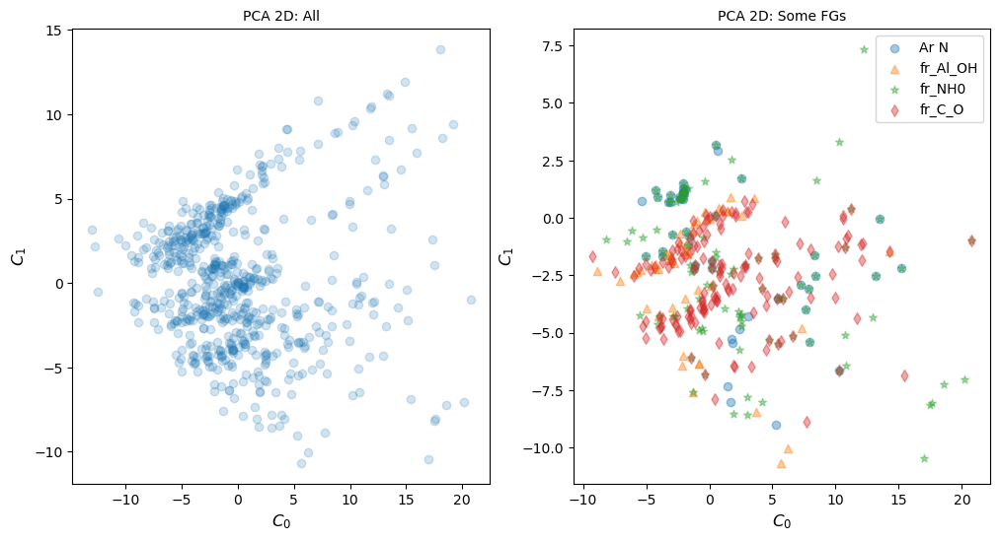

In [118]:
plt.figure(figsize = (12, 6))

plt.subplot(121)
plt.scatter(X2D[:, 0], X2D[:, 1], alpha = 0.2)
plt.title('PCA 2D: All')
plt.xlabel('$C_0$')
plt.ylabel('$C_1$')

plt.subplot(122)

plt.scatter(X2D[:, 0][functional_groups_RDK.fr_Ar_N > 0], X2D[:, 1][functional_groups_RDK.fr_Ar_N > 0], alpha = 0.4, marker = "o", label = 'Ar N')
plt.scatter(X2D[:, 0][functional_groups_RDK.fr_Al_OH > 0], X2D[:, 1][functional_groups_RDK.fr_Al_OH > 0], alpha = 0.4, marker = "^", label = 'fr_Al_OH')
plt.scatter(X2D[:, 0][functional_groups_RDK.fr_NH0 > 0], X2D[:, 1][functional_groups_RDK.fr_NH0 > 0], alpha = 0.4, marker = "*", label = 'fr_NH0')
plt.scatter(X2D[:, 0][functional_groups_RDK.fr_C_O > 0], X2D[:, 1][functional_groups_RDK.fr_C_O > 0], alpha = 0.4, marker = "d", label = 'fr_C_O')

plt.legend(loc = 'best', shadow = False, scatterpoints = 1)
plt.title('PCA 2D: Some FGs')
plt.xlabel('$C_0$')
plt.ylabel('$C_1$')
plt.plot()

In [119]:
pca_1D = PCA(n_components = 1)
X1D = pca_1D.fit_transform(X_solv_everything_scaled)

[]

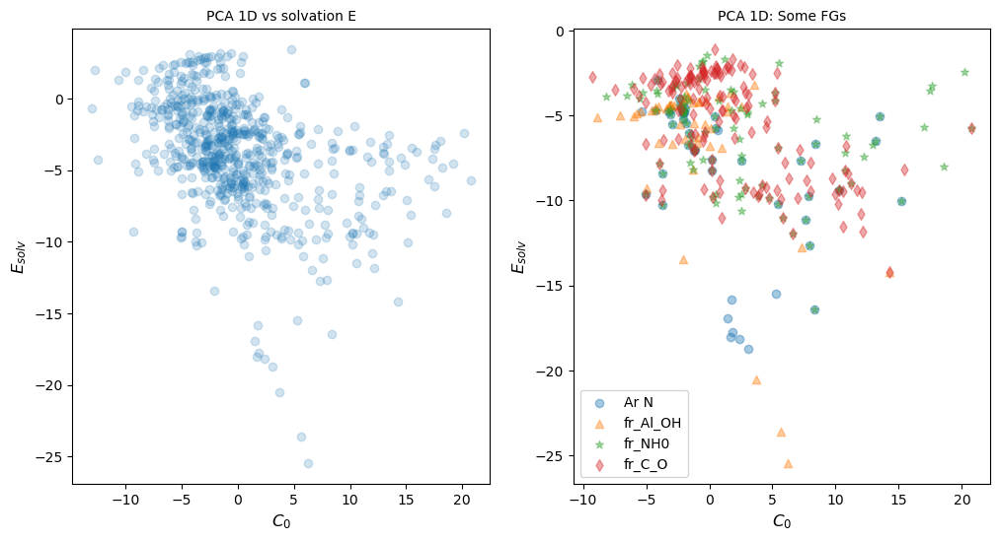

In [122]:
plt.figure(figsize = (12, 6))

plt.subplot(121)
plt.scatter(X1D, y_solv, alpha = 0.2)
plt.title('PCA 1D vs solvation E')
plt.xlabel('$C_0$')
plt.ylabel('$E_{solv}$')

plt.subplot(122)

plt.scatter(X1D[:, 0][functional_groups_RDK.fr_Ar_N > 0], y_solv[functional_groups_RDK.fr_Ar_N > 0], alpha = 0.4, marker = "o", label = 'Ar N')
plt.scatter(X1D[:, 0][functional_groups_RDK.fr_Al_OH > 0], y_solv[functional_groups_RDK.fr_Al_OH > 0], alpha = 0.4, marker = "^", label = 'fr_Al_OH')
plt.scatter(X1D[:, 0][functional_groups_RDK.fr_NH0 > 0], y_solv[functional_groups_RDK.fr_NH0 > 0], alpha = 0.4, marker = "*", label = 'fr_NH0')
plt.scatter(X1D[:, 0][functional_groups_RDK.fr_C_O > 0], y_solv[functional_groups_RDK.fr_C_O > 0], alpha = 0.4, marker = "d", label = 'fr_C_O')

plt.legend(loc = 'best', shadow = False, scatterpoints = 1)
plt.title('PCA 1D: Some FGs')
plt.xlabel('$C_0$')
plt.ylabel('$E_{solv}$')
plt.plot()

In [116]:
tsne2 = TSNE(learning_rate='auto'
             #, init='pca'
            ).fit_transform(X_solv_everything_scaled)

/Users/ansoncherk/mambaforge/envs/my_tf_env_3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


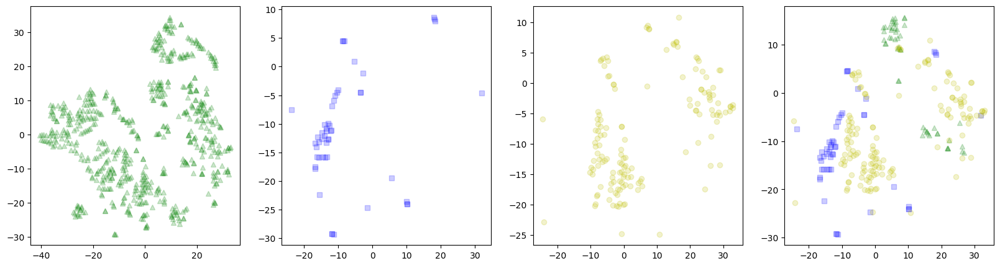

In [117]:
plt.figure(figsize = (20,5))

plt.subplot(141)
plt.plot(tsne2[:,0]#[functional_groups_RDK.fr_Ar_N > 0]
         , tsne2[:,1]#[functional_groups_RDK.fr_Ar_N > 0]
         , 'g^', alpha = 0.2)
#plt.axis([-50, 50, -50, 50])

plt.subplot(142)
plt.plot(tsne2[:,0][functional_groups_RDK.fr_Al_OH > 0], tsne2[:,1][functional_groups_RDK.fr_Al_OH > 0], 'bs', alpha = 0.2)
#plt.axis([-50, 50, -50, 50])

plt.subplot(143)
plt.plot(tsne2[:,0][functional_groups_RDK.fr_C_O > 0], tsne2[:,1][functional_groups_RDK.fr_C_O > 0], 'yo', alpha = 0.2)
#plt.axis([-50, 50, -50, 50])

plt.subplot(144)
plt.plot(tsne2[:,0][functional_groups_RDK.fr_Ar_N > 0], tsne2[:,1][functional_groups_RDK.fr_Ar_N > 0], 'g^', alpha = 0.2)
plt.plot(tsne2[:,0][functional_groups_RDK.fr_Al_OH > 0], tsne2[:,1][functional_groups_RDK.fr_Al_OH > 0], 'bs', alpha = 0.2)
plt.plot(tsne2[:,0][functional_groups_RDK.fr_C_O > 0], tsne2[:,1][functional_groups_RDK.fr_C_O > 0], 'yo', alpha = 0.2)
#plt.axis([-50, 50, -50, 50])

plt.show()